<b><FONT SIZE="6">Topic Modeling (Latent Dirichlet Allocation) - Analyse von ArXiv-Paper</FONT></b>

<b>Autor:</b> L. B. <br>
<b>Datum:</b> 21.11.2023<br>
___
`Um die Komplexität des Codes zu verringern und eine bessere Übersichtlichkeit zu gewährleisten, werden Attribute einer Methode, die nicht geändert werden und somit ihren Default-Wert behalten, nicht explizit mit aufgeführt.`
___

In [ ]:
# Import des Time-Moduls, um die Laufzeit des Trainings zu messen
import time

# Import der XML- und URL-Module für den Datenabzug
import xml.etree.ElementTree as ET
from urllib.request import urlopen

# Import der notwendigen Module für die Datenverarbeitung 
import numpy as np
import pandas as pd
from datetime import datetime

# Import des Pyplot-, Seaborn und Wordcloud-Moduls, um die Daten zu plotten
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid") # Stil der Seaborn-Plots

# Import des Pyprind-Moduls, um Fortschrittsbalken anzuzeigen  
import pyprind

# Festlegen des Seed-Keys für den Random Number Generator, um Reproduzierbarkeit zu gewährleisten
np.random.seed(815)

<b>___________________________________________________________________________________________________________________________</b>

# 1. Abruf der Daten von Arxiv
<a id="1"></a>

___
<b>Einordnung der Attribute der Metadaten nach Merkmalsart, da es sich fast ausschließlich um kategoriale Daten handelt </b>

<table class="tg">
  <tr>
    <th class="tg-s6z2">Author</th>
    <th class="tg-s6z2">Affiliation</th>
    <th class="tg-s6z2">ID</th>
    <th class="tg-s6z2">Updated</th>
    <th class="tg-s6z2">Published</th>
    <th class="tg-s6z2">Title</th>
    <th class="tg-s6z2">Summary</th>
    <th class="tg-s6z2">Primecategory</th>
    <th class="tg-s6z2">DOI</th>
    <th class="tg-s6z2">journal_ref</th>
    <th class="tg-s6z2">Comment<br></th>
    <th class="tg-s6z2">Category</th>
  </tr>
  <tr>
    <td class="tg-s6z2">nominal</td>
    <td class="tg-s6z2">nominal</td>
    <td class="tg-s6z2">ordinal</td>
    <td class="tg-s6z2">ordinal</td>
    <td class="tg-s6z2">ordinal</td>
    <td class="tg-s6z2">nominal</td>
    <td class="tg-s6z2">nominal</td>
    <td class="tg-s6z2">nominal</td>
    <td class="tg-s6z2">nominal</td>
    <td class="tg-s6z2">nominal</td>
    <td class="tg-s6z2">nominal</td>
    <td class="tg-s6z2">nominal</td>
  </tr>
</table>

## 1.1 Funktionsdefinition
___
<b>get_papers</b><br>
Über diese Funktion werden Metadaten anhand eines übergebenen Abfrage-Strings von der API der Webseite www.arxiv.org in XML-Format heruntergeladen und als Dataframe zurückgegeben. Die Spalten des DFs entsprechen dabei den extrahierten Attributen aus der obigen Tabelle, welche jeder Eintrag besitzt. Mithilfe des XML-Moduls werden die Daten sukzessive durchsucht und entsprechend extrahiert. Die Funktion verarbeitet die Daten bereits vor, da sie die Autoren-Spalte atomisiert. Pro Zelle gibt es also nur einen Autor, was dazu führt, dass in der Titel-Spalte Duplikate auftreten (abhängig von der Anzahl der Autoren). Dieses Vorgehen spart zum einen ein späteres Aufteilen der Autoren-Spalte und zum anderen vereinfachen sich dadurch Auswertungen wie z.B. Anzahl der Autoren pro Paper.

Laut __[Arxiv API-Doku](https://info.arxiv.org/help/api/user-manual.html)__ wird eine Idle-Time von mindestens 3 Sekunden empfohlen, um die API nicht zu überlasten, weshalb eine Wartezeit von 5 Sekunden implementiert wurde. Zusätzlich wurde ein Paging des Datenabzugs umgesetzt, um die Datengröße pro Abzug zu begrenzen. Hierzu werden die Abzüge in 1000 Paper große Blöcke eingeteilt und anschließend iterativ geladen. Laut API-Doku liegt die Grenze der Paginggröße bei 2000, jedoch sind für den vorliegenden Fall 1000 ausreichend (Kompromiss aus Zeit und Serverload). Des weiteren begrenzt die API die Datenmenge bei 30.000 Papers, weshalb hierfür ebenfalls eine Grenze implementiert wurde. Da es auf Seiten der API, teilweise zu leeren Responses kommt, wird nach jedem Response die Menge der übergebenen Paper geprüft und die Anfrage gegebenenfalls mit der gleichen Query-URL wiederholt bzw. der Iterationsschritt wiederholt.

In [2]:
# Funktion zum Laden und speichern der Daten von ArXiv
def get_papers(query):   

    print('Arxiv Abfrage gestartet')
    print('Abfrage String: ', query) # Anzeigen des Abfragstrings
    
    # Anlegen des Dictionary zur zwischenspeicherung
    dict_entry = {}
     # Ergebnis Dataframe erzeugen
    df_all_entries = pd.DataFrame()
    
    # Festlegen der drei Namespaces laut Doku zur Merkmalsextraktion
    ns = {'papers':'http://www.w3.org/2005/Atom', 
          'arxiv':'http://arxiv.org/schemas/atom', 
          'os':'http://a9.com/-/spec/opensearch/1.1/'}
    
    # Basis URL der API
    base_url = 'http://export.arxiv.org/api/query?' 
    
    # Suchparameter
    search_query = query # Abfragestring bzw. Query
    start_query = 0  # Initiale Untergrenze fürs Paging
    max_results = 999  # Obergrenze fürs Paging 
    
    calc_steps = 1 # intiale Anzahl der Durchläufe 
    loop_cnt = 0 # Durchlaufzähler                            
  
    # Durchlauf der Abfrage
    while  loop_cnt <= calc_steps:                
        
        # Abfragestring erzeugen und Response absteigend nach Published sortieren
        string_url = '{}search_query={}&start={}&max_results={}&sortBy=submittedDate&sortOrder=descending'.format(base_url, search_query, start_query, max_results)
        
        response = urlopen(string_url)  # GET Anfrage mit Abfragestring absenden
        data = ET.parse(response)       # Antwort parsen mit element tree
        root = data.getroot()           # Wurzelelement der Daten ermitteln
        
        #initial total Results auslesen und Paging durchführen
        if(loop_cnt == 0):  
            # Gesamtmenge der Paper ermitteln
            for totalResults in root.findall('os:totalResults', ns):
                results_total = int(root.find('os:totalResults', ns).text)     
            print('Menge aller gefundener Paper: ', results_total)
            
            # Abfrageschritte mit 1000 Papers je Abzug berechnen
            calc_steps = int((results_total/1000)) 
            
            # Menge des letzten Abfrageschritts berechnen
            calc_steps_remainder = results_total%1000        
            print('Abzug ist nach %i Durchlaeufen beendet' %(calc_steps+1))              
            print('Durchlauf 1 gestartet')             
        
        # Durchlaufnummer ausgeben
        else:
            print("-------------------------------------------------------------------------------")
            print('Durchlauf %i gestartet' %(loop_cnt+1))     
        
        # Anzahl der Iterationsschritte auf Länge der Einträge setzen bzw. Initialisierung des Fortschrittbalken-Objekts 
        pbar = pyprind.ProgBar(len(root.findall('papers:entry', ns)))    
        
        # Metadaten auslesen und in Dictionary ablegen
        for entry in root.findall('papers:entry', ns):          
            # Autoren einlesen und pro Author und pro Paper einen Eintrag anlegen
            for author in entry.findall('papers:author', ns):
                # Autor einlesen
                dict_entry['Author'] = author.find('papers:name', ns).text
                             
                # url von der ID abschneiden und diese einlesen - URL wird nicht benötigt
                dict_entry['ID'] = entry.find('papers:id', ns).text[21:]             
                
                #Einlesen weiterer Metadaten
                dict_entry['Updated'] = pd.to_datetime(entry.find('papers:updated', ns).text[:10]) # Datum ohne Uhrzeit einlesen
                dict_entry['Published'] = pd.to_datetime(entry.find('papers:published', ns).text[:10]) # Datum ohne Uhrzeit einlesen      
                dict_entry['Title'] =       entry.find('papers:title', ns).text # Titel einlesen
                dict_entry['Summary'] =     entry.find('papers:summary', ns).text # Summare einlesen
                dict_entry['Primecategory'] = entry.find('arxiv:primary_category', ns).attrib['term'] # Primcategory einlesen
                
                # Wenn keine Affilaiation angegeben, dann no affiliation einfügen
                try:
                    for author in entry.findall('papers:author', ns):
                        dict_entry['Affiliation'] = author.find('arxiv:affiliation', ns).text
                except AttributeError:
                    dict_entry['Affiliation'] = 'no affiliation'
                    pass                    
                   
                # Wenn keine DOI angegeben ist, wird no doi eingefügt
                try:
                    dict_entry['doi'] = entry.find('arxiv:doi', ns).text
                except AttributeError:
                    dict_entry['doi'] = 'no doi'
                
                # wenn kein Journal angegeben ist, wird no journal ref eingefügt
                try:
                    dict_entry['journal_ref'] = entry.find('arxiv:journal_ref', ns).text
                except AttributeError:
                    dict_entry['journal_ref'] = 'no journal ref'
                
                # wenn kein Kommentar angegeben ist, wird no comment eingefügt              
                try:
                    dict_entry['Comment'] = entry.find('arxiv:comment', ns).text
                except AttributeError:
                    dict_entry['Comment'] ='no comment'
            
                # Unterkategorien einlesen und per Semikolon trennen  
                category_tmp = ''
                for category in entry.findall('papers:category', ns):
                    if len(category_tmp) == 0:
                        category_tmp = category.attrib['term']
                    else:
                        category_tmp= '{};{}'.format(category_tmp, category.attrib['term'])
                dict_entry['Category'] = category_tmp     
                 
                # Dictionary in Dataframe umwandeln, transponieren und an Ergebnis-DF anhängen
                df_all_entries = pd.concat([df_all_entries, pd.DataFrame.from_dict(dict_entry, orient='index').T], ignore_index=True)
           
            # Progressbar inkrementieren
            pbar.update()      
        
        # Status ausgeben und Fehlerprüfung
        if len(root.findall('papers:entry', ns)) != 0:         
            print('Durchlauf %i von maximal %i Durchlaeufen beendet' %(loop_cnt+1, calc_steps+1))   
            loop_cnt += 1               
           
            # Argumente für die url erhöhen           
            start_query += 1000  
            
            # Maximalgrenze der API einhalten
            if start_query > 30000:
                print("Maximale Größe von 30.000 Papers erreicht. Der Abzug wird vorzeitig beendet.")
                break
            
            #letzte Abfrage angepasst auf die Restmenge
            if(start_query == results_total-calc_steps_remainder):  
                max_results = calc_steps_remainder                 
        # Abfangen von Abfrage- bzw. Antwortfehlern bei denen die Anzahl der Paper 0 ist
        else:
            print("Erhaltene Paper: ",len(root.findall('papers:entry', ns)))
            print("Abfragefehler! Durchlauf %i wird wiederholt" %(loop_cnt+1))
            
        # Wartezeit nach jedem Abzug
        if(loop_cnt < (calc_steps-1)):
            idle_time = 5
            while idle_time > 0:
                print('Sleep: %is' %idle_time)
                time.sleep(1)
                idle_time -= 1        

        
    # alles wird in am besten geeigneten Pandas-Datentyp umgewandelt
    df_all_entries= df_all_entries.convert_dtypes()
    
    print('Anzahl der gespeicherten Eintraege nach aufgespalteten Autoren: ', df_all_entries.shape[0])
    
    # evtl. aufgetretene Duplikate bei der Rückgabe entfernen
    return df_all_entries.drop_duplicates()

___
<b>count_words</b><br>
Diese Funktion dient dem Zählen der Wörter für spätere Auswertungen. Als Eingabe muss eine Series mit Strings übergeben werden und es wird die Anzahl der enthaltenen Wörter zurückgegeben. 

In [3]:
# Funktion zum Zählen der Wörter in einer Spalte
def count_words(papers):
    return papers.str.split().str.len().sum()

___
## 1.2 Datenabzug
Für die nachfolgende Verarbeitung werden alle Papers geladen, bei denen "convolutional neural network" im Abstract oder im Titel vorkommt. Dabei fungiert "%22" als doppeltes Anführungszeichen und "+" als Leerzeichen.

In [4]:
# Laden der Daten mit dem entsprechenden query 
df_data = get_papers("abs:%22convolutional+neural+network%22+OR+ti:%22convolutional+neural+network%22")

Arxiv Abfrage gestartet
Abfrage String:  abs:%22convolutional+neural+network%22+OR+ti:%22convolutional+neural+network%22
Menge aller gefundener Paper:  20557
Abzug ist nach 21 Durchlaeufen beendet
Durchlauf 1 gestartet


0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:00:11


Durchlauf 1 von maximal 21 Durchlaeufen beendet
Sleep: 5s
Sleep: 4s
Sleep: 3s
Sleep: 2s
Sleep: 1s
-------------------------------------------------------------------------------
Durchlauf 2 gestartet


0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:00:11


Durchlauf 2 von maximal 21 Durchlaeufen beendet
Sleep: 5s
Sleep: 4s
Sleep: 3s
Sleep: 2s
Sleep: 1s
-------------------------------------------------------------------------------
Durchlauf 3 gestartet


0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:00:14


Durchlauf 3 von maximal 21 Durchlaeufen beendet
Sleep: 5s
Sleep: 4s
Sleep: 3s
Sleep: 2s
Sleep: 1s
-------------------------------------------------------------------------------
Durchlauf 4 gestartet


0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:00:22


Durchlauf 4 von maximal 21 Durchlaeufen beendet
Sleep: 5s
Sleep: 4s
Sleep: 3s
Sleep: 2s
Sleep: 1s
-------------------------------------------------------------------------------
Durchlauf 5 gestartet
Erhaltene Paper:  0
Abfragefehler! Durchlauf 5 wird wiederholt
Sleep: 5s
Sleep: 4s
Sleep: 3s
Sleep: 2s
Sleep: 1s
-------------------------------------------------------------------------------
Durchlauf 5 gestartet


0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:00:22


Durchlauf 5 von maximal 21 Durchlaeufen beendet
Sleep: 5s
Sleep: 4s
Sleep: 3s
Sleep: 2s
Sleep: 1s
-------------------------------------------------------------------------------
Durchlauf 6 gestartet
Erhaltene Paper:  0
Abfragefehler! Durchlauf 6 wird wiederholt
Sleep: 5s
Sleep: 4s
Sleep: 3s
Sleep: 2s
Sleep: 1s
-------------------------------------------------------------------------------
Durchlauf 6 gestartet


0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:00:24


Durchlauf 6 von maximal 21 Durchlaeufen beendet
Sleep: 5s
Sleep: 4s
Sleep: 3s
Sleep: 2s
Sleep: 1s
-------------------------------------------------------------------------------
Durchlauf 7 gestartet


0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:00:26


Durchlauf 7 von maximal 21 Durchlaeufen beendet
Sleep: 5s
Sleep: 4s
Sleep: 3s
Sleep: 2s
Sleep: 1s
-------------------------------------------------------------------------------
Durchlauf 8 gestartet


0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:00:38


Durchlauf 8 von maximal 21 Durchlaeufen beendet
Sleep: 5s
Sleep: 4s
Sleep: 3s
Sleep: 2s
Sleep: 1s
-------------------------------------------------------------------------------
Durchlauf 9 gestartet
Erhaltene Paper:  0
Abfragefehler! Durchlauf 9 wird wiederholt
Sleep: 5s
Sleep: 4s
Sleep: 3s
Sleep: 2s
Sleep: 1s
-------------------------------------------------------------------------------
Durchlauf 9 gestartet
Erhaltene Paper:  0
Abfragefehler! Durchlauf 9 wird wiederholt
Sleep: 5s
Sleep: 4s
Sleep: 3s
Sleep: 2s
Sleep: 1s
-------------------------------------------------------------------------------
Durchlauf 9 gestartet


0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:00:43


Durchlauf 9 von maximal 21 Durchlaeufen beendet
Sleep: 5s
Sleep: 4s
Sleep: 3s
Sleep: 2s
Sleep: 1s
-------------------------------------------------------------------------------
Durchlauf 10 gestartet


0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:00:47


Durchlauf 10 von maximal 21 Durchlaeufen beendet
Sleep: 5s
Sleep: 4s
Sleep: 3s
Sleep: 2s
Sleep: 1s
-------------------------------------------------------------------------------
Durchlauf 11 gestartet


0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:00:47


Durchlauf 11 von maximal 21 Durchlaeufen beendet
Sleep: 5s
Sleep: 4s
Sleep: 3s
Sleep: 2s
Sleep: 1s
-------------------------------------------------------------------------------
Durchlauf 12 gestartet


0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:00:44


Durchlauf 12 von maximal 21 Durchlaeufen beendet
Sleep: 5s
Sleep: 4s
Sleep: 3s
Sleep: 2s
Sleep: 1s
-------------------------------------------------------------------------------
Durchlauf 13 gestartet


0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:00:51


Durchlauf 13 von maximal 21 Durchlaeufen beendet
Sleep: 5s
Sleep: 4s
Sleep: 3s
Sleep: 2s
Sleep: 1s
-------------------------------------------------------------------------------
Durchlauf 14 gestartet


0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:00:47


Durchlauf 14 von maximal 21 Durchlaeufen beendet
Sleep: 5s
Sleep: 4s
Sleep: 3s
Sleep: 2s
Sleep: 1s
-------------------------------------------------------------------------------
Durchlauf 15 gestartet


0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:00:54


Durchlauf 15 von maximal 21 Durchlaeufen beendet
Sleep: 5s
Sleep: 4s
Sleep: 3s
Sleep: 2s
Sleep: 1s
-------------------------------------------------------------------------------
Durchlauf 16 gestartet


0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:00:58


Durchlauf 16 von maximal 21 Durchlaeufen beendet
Sleep: 5s
Sleep: 4s
Sleep: 3s
Sleep: 2s
Sleep: 1s
-------------------------------------------------------------------------------
Durchlauf 17 gestartet


0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:00:55


Durchlauf 17 von maximal 21 Durchlaeufen beendet
Sleep: 5s
Sleep: 4s
Sleep: 3s
Sleep: 2s
Sleep: 1s
-------------------------------------------------------------------------------
Durchlauf 18 gestartet


0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:01:01


Durchlauf 18 von maximal 21 Durchlaeufen beendet
Sleep: 5s
Sleep: 4s
Sleep: 3s
Sleep: 2s
Sleep: 1s
-------------------------------------------------------------------------------
Durchlauf 19 gestartet
Erhaltene Paper:  0
Abfragefehler! Durchlauf 19 wird wiederholt
Sleep: 5s
Sleep: 4s
Sleep: 3s
Sleep: 2s
Sleep: 1s
-------------------------------------------------------------------------------
Durchlauf 19 gestartet


0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:00:58


Durchlauf 19 von maximal 21 Durchlaeufen beendet
-------------------------------------------------------------------------------
Durchlauf 20 gestartet
Erhaltene Paper:  0
Abfragefehler! Durchlauf 20 wird wiederholt
-------------------------------------------------------------------------------
Durchlauf 20 gestartet
Erhaltene Paper:  0
Abfragefehler! Durchlauf 20 wird wiederholt
-------------------------------------------------------------------------------
Durchlauf 20 gestartet
Erhaltene Paper:  0
Abfragefehler! Durchlauf 20 wird wiederholt
-------------------------------------------------------------------------------
Durchlauf 20 gestartet
Erhaltene Paper:  0
Abfragefehler! Durchlauf 20 wird wiederholt
-------------------------------------------------------------------------------
Durchlauf 20 gestartet


0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:00:55


Durchlauf 20 von maximal 21 Durchlaeufen beendet
-------------------------------------------------------------------------------
Durchlauf 21 gestartet


0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:00:35


Durchlauf 21 von maximal 21 Durchlaeufen beendet
Anzahl der gespeicherten Eintraege nach aufgespalteten Autoren:  93707


___
Nach dem Abzug der Daten wird der erste Eintrag angezeigt, um das Ergebnis auf Konsistenz zu prüfen. Anschließend werden erste Informationen extrahiert und und geprüft, ob NULL-Werte oder Duplikate in den Daten vorhanden sind.

In [6]:
# Anzeigen des ersten Eintrags
df_data.head(1)

,Author,ID,Updated,Published,Title,Summary,Primecategory,Affiliation,doi,journal_ref,Comment,Category
0,Sara Pieri,2310.15165v1,2023-10-23,2023-10-23,Handling Data Heterogeneity via Architectural ...,Federated Learning (FL) is a promising resea...,cs.CV,no affiliation,no doi,no journal ref,to be published in NeurIPS 2023,cs.CV;cs.AI;cs.LG


In [7]:
# Ausgabe der Menge der Paper
len(df_data.value_counts("Title"))

20529

In [8]:
# Informationen über die Daten anzeigen
df_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 93686 entries, 0 to 93706
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Author         93686 non-null  string        
 1   ID             93686 non-null  string        
 2   Updated        93686 non-null  datetime64[ns]
 3   Published      93686 non-null  datetime64[ns]
 4   Title          93686 non-null  string        
 5   Summary        93686 non-null  string        
 6   Primecategory  93686 non-null  string        
 7   Affiliation    93686 non-null  string        
 8   doi            93686 non-null  string        
 9   journal_ref    93686 non-null  string        
 10  Comment        93686 non-null  string        
 11  Category       93686 non-null  string        
dtypes: datetime64[ns](2), string(10)
memory usage: 9.3 MB


In [9]:
# Prüfen auf NA
print('Prüfen von fehlenden Daten')
df_data.isna().sum()

Prüfen von fehlenden Daten


Author           0
ID               0
Updated          0
Published        0
Title            0
Summary          0
Primecategory    0
Affiliation      0
doi              0
journal_ref      0
Comment          0
Category         0
dtype: int64

In [10]:
# Duplikate feststellen - Kann eigentlich weggelassen werden, da Duplikate beim Return entfernt werden
print("Prüfen von Duplikaten")
df_data.duplicated().value_counts()

Prüfen von Duplikaten


False    93686
dtype: int64

Anhand der oben ausgegebenen Informationen lässt sich bereits ablesen, dass 20529 Paper in dem Datensatz vorhanden sind. Insgesamt enthält der Dataframe 93686 Einträge, von denen keiner fehlende Daten enthält oder ein Duplikat ist. Die Spalten Publisched und Updated enthalten einen datetime64 Datentyp, während alle restlichen Spalten Strings enthalten.<br>
<b>___________________________________________________________________________________________________________________________</b>

# 2. Plotten von den Top10 Autoren nach Anzahl der Papers
<a id="2"></a>

Der folgende Code zeigt die Top10 Autoren von 2017 bis 2021. Dabei wird angenommen, dass der Name eines Autors einzigartig ist. Somit wird jeder Name nur einer Person zugeordnet und es wird vorausgesetzt, dass es keine Autoren mit dem gleichen Namen gibt.

In [ ]:
# Daten nach Author und Published gruppieren sowie Anzahl der Paper in Spalte "Amount of Books" speichern
df_tmp = df_data.groupby(["Author","Published"]).size().reset_index(name="Amount of Books")

# Index der 10 Autoren mit den meisten Paper ermitteln
index_top10 = df_data.Author.value_counts().nlargest(10).index

# Herausfiltern der Top10 Autoren 
df_top10 = df_tmp[df_tmp["Author"].isin(df_data.Author.value_counts().nlargest(10).index)]

# Umwandeln der Published Spalte in Jahre
df_top10['Published'] = pd.DatetimeIndex(df_top10['Published']).year

# alles über 2021 und unter 2017 entfernen
df_top10 = df_top10.drop(df_top10[df_top10.Published > 2021].index)
df_top10 = df_top10.drop(df_top10[df_top10.Published < 2017].index)

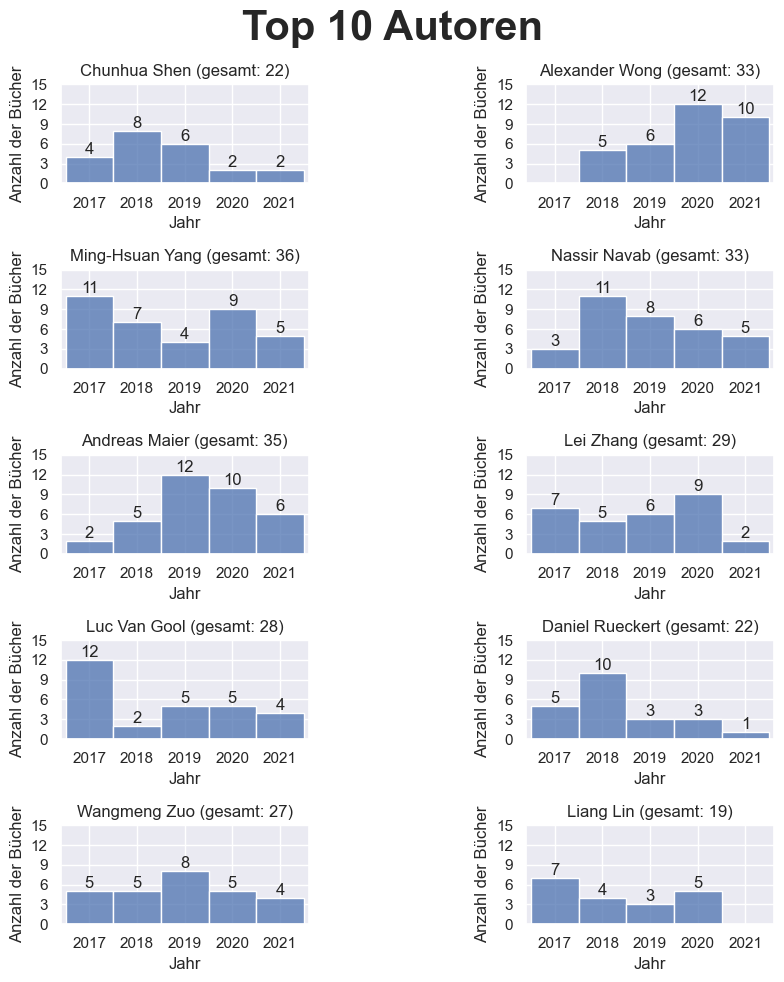

In [12]:
i=1 # Zählvariable initialisieren

plt.figure(figsize=(8, 10)) # Größe der Plots festlegen
xmin = df_top10["Published"].min() # dynamisches Ermitteln kleinsten Jahres 
xmax = df_top10["Published"].max() # dynamisches Ermitteln höchsten Jahres 

# Plotten aller Autoren im Top10-Datensatz
for author in index_top10:
    plt.subplot(5,2,i) # 5x2 Grid erzeugen und Achse zuweisen (Zeilen, Spalten, Nummer)
    
    # Auf den entsprechenden Autor filtern und die Published-Werte als Daten verwenden
    ax = sns.histplot(df_top10[df_top10["Author"] == author].Published,
                      bins="auto",
                      discrete=True)    
    plt.xlim([xmin-0.6, xmax+0.6]) # Einteilung der X-Achse festlegen; kleinstes Jahr bis höchstes Jahr
    plt.xticks(np.arange(xmin,xmax+1,1)) # X-Achsenticks festlegen
    plt.yticks(range(0,16,3)) # Einteilung der Y-Achse festlegen; 0 bis 16 und in 3-Schritten markieren
    plt.xlabel("Jahr") # X-Achsenbeschriftung festlegen
    plt.ylabel("Anzahl der Bücher") # Y-Achsenbeschriftung festlegen
    plt.tight_layout(w_pad = 10) # Füllung zwischen den Plots bzw. Layout anpassen
    plt.title("%s (gesamt: %s)" %(author, (df_top10.Author == author).sum())) # Autorname und Paperanzahl in den Titel schreiben
    
    # Hauptüberschrift festlegen
    plt.suptitle("Top 10 Autoren", # String übergeben
                 fontweight="bold", # Fettdruck aktivieren
                 fontsize=30) # Schriftgröße festlegen
    
    # Anzahl der Paper des entsprechenden Jahres an den Balken anfügen
    for n in ax.containers:
        ax.bar_label(n)
    i+=1 # Zählvariable inkrementieren    
plt.show()

<b>___________________________________________________________________________________________________________________________</b>

# 3. Data Mining auf strukturierte Daten (Understanding)
<a id="3"></a>

In [13]:
# Anzeigen des ersten Datensatzes
df_data.head(1)

,Author,ID,Updated,Published,Title,Summary,Primecategory,Affiliation,doi,journal_ref,Comment,Category
0,Sara Pieri,2310.15165v1,2023-10-23,2023-10-23,Handling Data Heterogeneity via Architectural ...,Federated Learning (FL) is a promising resea...,cs.CV,no affiliation,no doi,no journal ref,to be published in NeurIPS 2023,cs.CV;cs.AI;cs.LG


Da es in den Daten keine numerischen Informationen gibt, außer die Datumsspalten, ist der Erkenntnisgewinn der statistischen Zusammenfassung geringer, jedoch nicht null. Nachfolgend wird diese ausgeführt. 

In [14]:
# Statistische Zusammenfassung der numerischen Spalten
df_data.describe(include="all", # alle Spalten verwenden
                 datetime_is_numeric=True) # Datetime-Spalten einbeziehen 

,Author,ID,Updated,Published,Title,Summary,Primecategory,Affiliation,doi,journal_ref,Comment,Category
count,93686,93686,93686,93686,93686,93686,93686,93686,93686,93686,93686,93686
unique,57447,20537,NaN,NaN,20529,20534,114,242,4469,2414,10460,3164
top,Chunhua Shen,2203.17053v2,NaN,NaN,Separation of track- and shower-like energy de...,Liquid argon time projection chamber detecto...,cs.CV,no affiliation,no doi,no journal ref,no comment,cs.CV
freq,50,1224,NaN,NaN,1224,1224,40488,91970,68164,78903,34028,24944
mean,NaN,NaN,2020-07-18 15:09:55.068633600,2020-05-01 23:51:05.106846208,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,2011-02-01 00:00:00,2011-02-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,2019-01-31 06:00:00,2018-11-09 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,2020-10-01 00:00:00,2020-06-26 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,2022-03-28 00:00:00,2021-12-27 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
max,NaN,NaN,2023-10-23 00:00:00,2023-10-23 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Durch die statistische Zusammenfassung lassen sich bereits folgende Informationen extrahieren. Hierbei muss jedoch beachtet werden, dass die Daten nach den Autoren und nicht nach den Titeln oder der ID atomisiert wurden, weshalb der Wert "count" nicht als Anzahl der Paper interpretiert werden darf. 
1. <b>Author:</b> Es kommen 57447 verschiedene Autoren in den Daten vor, wobei der Autor "Chunhua Shen" mit einer Anzahl von 50 mal am meisten auftaucht.
2. <b>ID:</b> In den Daten kommen 20511 unterschiedliche IDs vor, wobei die Top-ID 1224 mal auftaucht. Dies ist darauf zurückzuführen, dass es ein Paper gibt, welches 1224 Autoren besitzt.
3. <b>Updated/Published:</b> Beide Daten ähneln sich, sie beschreiben jedoch unterschiedliche Fakten. An dieser Stelle werden sie jedoch zusammengefasst, da folglich nur das Veröffentlichungsdatum von Relevanz ist. Erkennen lässt sich, dass das erste Paper zu dem Thema am 1. Februar 2011 und das letzte am 23. Oktober 2023 veröffentlich wurde.
4. <b>Title:</b> An dieser Spalte lässt sich die Menge der einzelnen Paper erkennen, welche 20529 entspricht. Zusätzlich lässt sich das Paper mit den meisten Autoren herauslesen, das 1224 Autoren besitzt. Dieses Paper ist eine Arbeit bzw. ein Gemeinschaftsprojekt der DUNE Collaboration, von der alle Mitglieder aufgeführt wurden. Des Weiteren lässt sich eine Diskrepanz zwischen der Anzahl der einzigartigen Titel und IDs erkennen. Hier gibt es mehr IDs als Titel, was darauf hinweist ist, dass einige Paper mehrfach unter dem selben Titel veröffentlicht wurden.
5. <b>Summary:</b> Hierin lassen sich vorerst keine weiteren statistischen Informationen erkennen. Wobei die Menge einzigartiger Summaries zwischen Title und ID liegt, was eine Diskrepanz anzeigt.
6. <b>Primecategory:</b> Jedem Paper ist eine Kategorie zugeordnet, wobei die Kategorie cs.CV (computer science.Computer Vision) erwartungsgemäß die Top-Kategorie ist. Insgesamt werden 114 verschiedene Kategorien verwendet.
7. <b>Affiliation:</b> Es gibt 241 unterschiedliche Affiliations, wobei die absolute Mehrheit keine Affiliation aufweist.
8. <b>doi:</b> Der absoluten Mehrheit der Einträge ist keine DOI zugeordnet.
9. <b>journal_ref:</b> Der absoluten Mehrheit der Einträge ist keine Journal-Referenz zugeordnet, wobei es ingesamt 2413 unterschiedliche Journal Nennungen gibt.
10. <b>Comment:</b> Der absoluten Mehrheit der Einträge ist kein Kommentar zugeordnet.
11. <b>Category:</b> Diese Feld setzt sich teilweise aus mehreren Unterkategorien zusammen, welche nicht aufgeteilt wurden. Somit ist bietet statistische Auswertung ohne weitere Verarbeitungsschritte keine weiteren nützlichen Informationen

Es lassen sich hierbei bereits einige Diskrepanzen in den Daten feststellen, die Gründe hierfür können unterschiedlich sein. Im Folgenden wird die Title-Spalte als Referenz festgelegt, womit es 20529 Paper in den Daten gibt.

## 3.1 Korrelationensmatrix erzeugen
Um etwaige Korrelationen zwischen den einzelnen Werten bzw. Spalten erkennen zu können, müssen vorerst alle kategorialen Merkmale in numerische Werte umgewandelt werden. Hierfür wird die fit_transform-Methode verwendet, welche Teil des sklearn LabelEncoders ist und diese Funktion bereits effizient implementiert. Um dabei nicht die Ursprungsdaten zu manipulieren, wird ein neuer Dataframe angelegt und mit den transformierten Daten befüllt.  

In [15]:
# importieren der LabelEncoder-Klasse
from sklearn.preprocessing import LabelEncoder

# Erzeugen des LabelEncoders
cat_le = LabelEncoder()

# Sukzessives Transformieren der Daten
trans_author = cat_le.fit_transform(df_data["Author"].values)
trans_affiliation = cat_le.fit_transform(df_data["Affiliation"].values)
trans_id = cat_le.fit_transform(df_data["ID"].values)
trans_updated = cat_le.fit_transform(df_data["Updated"].values)
trans_published = cat_le.fit_transform(df_data["Published"].values)
trans_title = cat_le.fit_transform(df_data["Title"].values)
trans_summary = cat_le.fit_transform(df_data["Summary"].values)
trans_category = cat_le.fit_transform(df_data["Primecategory"].values)
trans_doi = cat_le.fit_transform(df_data["doi"].values)
trans_journal = cat_le.fit_transform(df_data["journal_ref"].values)
trans_comment = cat_le.fit_transform(df_data["Comment"].values)
trans_subcategory = cat_le.fit_transform(df_data["Category"].values)

In [16]:
# Transformierte Daten in Dataframe speichern
df_trans_data = pd.DataFrame({"Author": trans_author,
                                "Affiliation": trans_affiliation,
                                "Title": trans_title,
                                "Primecategory": trans_category,
                                "Journal": trans_journal,
                                "ID": trans_id,
                              "Published": trans_published,
                              "Updated": trans_updated,
                              "Doi": trans_doi,
                              "Comment": trans_comment,
                              "Summary": trans_summary,
                              "Category" : trans_subcategory})

# Anzeigen des ersten Datensatzes der transformierten Daten
df_trans_data.head(1)

,Author,Affiliation,Title,Primecategory,Journal,ID,Published,Updated,Doi,Comment,Summary,Category
0,42453,235,10139,19,2400,20536,3113,3058,4468,10401,5894,672


Anhand der oberen Ausgabe ist erkennbar, dass der Labelecnoder korrekt gearbeitet hat und alle kategorialen Merkmale in numerische Werte transformiert wurden. Hierbei bietet es sich an anschließend ein Streudiagramm für alle Merkmale zu erzeugen, um zu prüfen, ob bereits Korrelationen erkennbar sind.

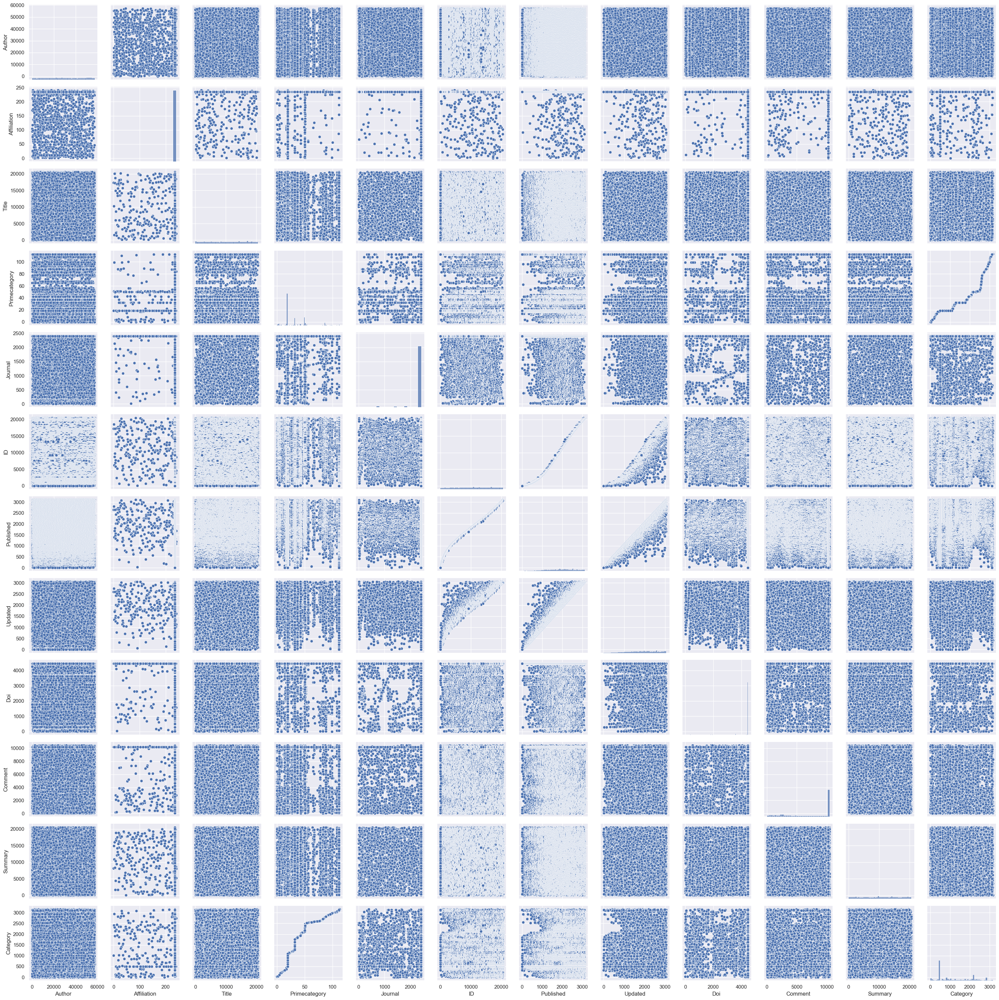

In [17]:
# Erzeugen von Streudiagrammen über alle Merkmale
sns.pairplot(df_trans_data, # Daten übergeben
             height=2.5) # Höhe festlegen
plt.tight_layout() # enges Layout für bessere Übersicht wählen
plt.show()

Bei der Analyse der Streudiagramme lassen sich bereits einige Korrelationen erkennen. So korreliert die ID mit Updated und Published. Bei letzterem ist dies sogar annähernd linear. Daraus folgt logischerweise, es ist aber auch optisch erkennbar, dass Published und Updated ähnlich stark korrelieren. Zwischen der Doi und dem Journal lässt sich auch eine Korrelation vermuten, da hier teilweise "leere" Gebiete bzw. Cluster zu erkennen sind. Zusätzlich gibt es einen starken Zusammenhang zwischen der Primecategory und der Category sowie leichte Abhängigkeiten zwischen Primecategory und ID, Published und Updated. Weiterhin gibt es optisch kaum erkennbare Muster oder Zusammenhänge zwischen den Werten. <br>
Es bietet sich nun an den Korrelationskoeffizient zu berechnen, um die paarweise Korrelation der Spalten zu quantifizieren und systematisch bewerten zu können. Hierfür stellt Pandas bereits die corr()-Methode zur Verfügung, welche im Folgenden angewedet wird.

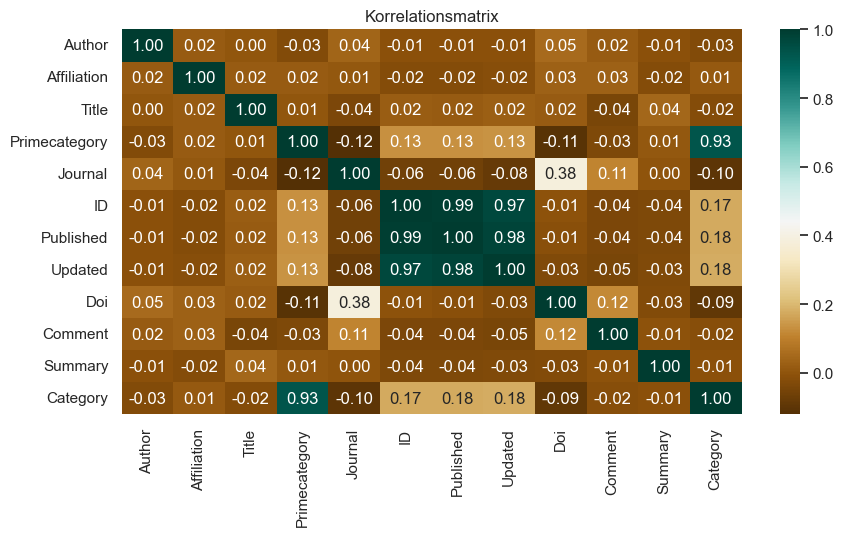

In [18]:
plt.figure(figsize=(10,5)) # Größe der Matrix festlegen
corr = df_trans_data.corr() # Berechnen der Korrelationsmatrix

# Plotten der Korrelationsmatrix
sns.heatmap(corr, # Daten übergeben
            cmap="BrBG", # Colormap auswählen
            annot=True, # Datenwert in jede Zelle Eintragen
            fmt=".2f") # Datenwert bis zwei Stellen hinter dem Komma anzeigen
plt.title("Korrelationsmatrix") # Titel festlegen
plt.show()

Wie in den Streudiagrammen bereits identifiziert, zeigt sich auch in der Korrelationsmatrix, dass ID, Published und Updated sehr stark korrelieren. Dies hängt mit der Zusammensetzung der ID zusammen, da diese sich aus dem Published Datum zusammensetzt. Auffällig ist eine leichte Korrelation zwischen der Primecategory und ID, Published und Updated. Dies deutet daraufhin, dass sich die Kategorie der Paper in Abhängigkeit mit der Zeit verändert hat. Die sehr hohe Korrelation zwischen der Primecategory und der Category zeigt sich ebenfalls, weshalb die Category annähernd ähnliche Korrelationen wie die Primecategory besitzt. Weiterhin bestätigt sich die erste Annahme zwischen der Doi und dem Journal, denn auch hier besteht eine leicht erhöhte Korrelation. Eine Verbindung zwischen der Primecategory und dem Journal besteht ebenfalls. Dies könnte sich darauf zurückführen lassen, dass ein Großteil der Paper mit "no journal ref" versehen wurde. Zusätzlich könnte es erklären, warum zwischen Comment und journal_ref ein Zusammenhang besteht. Beide Spalten haben eine hohe Anzahl an "no comment" bzw. "no journal ref". Dies führt in diesem Fall auch dazu, dass es eine leichte Korrelation zwischen Comment und der Doi gibt. <br>
Da es sich bei jedem Paper um ein unabhängiges Dokument handelt, es also keine Referenzen über die Metadaten auf andere Paper hat, lassen sich an dieser Stelle wenig bis kaum weitere Korrelationen erkennen.

ID und Updated können entfernt werden, da diese eine sehr hohe Korrelation mit dem Published-Datum besitzen und ansonsten wenig Informationen liefern bzw. keine weitere Korrelationen besitzen. Aufgrund des starken Zusammenhangs zwischen der Primecategory und der Category wird die Category ebenfalls entfernt.

Aufgrund der sehr starken Korrelation mit Published werden ID und Updated entfernt, da sie keine weiteren nützlichen Informationen enthalten und auch nicht mit anderen Spalten korrelieren. 

In [19]:
df_data = df_data.drop(["ID","Updated","Category"], axis=1) # Entfernen der angegebenen Spalten 

___
## 3.2 Paper pro Jahr
<a id="3.2"></a>
Im Folgenden soll gezeigt werden, wie sich die Anzahl der veröffentlichten Paper über die Jahre entwickelt hat.

In [20]:
# Kopie der Daten erzeugen, um diese nicht zu verändern
df_tmp = pd.DataFrame(df_data, copy=True)

# Der Kopie eine Spalte mit Jahren hinzufügen
df_tmp["Year"] = df_data["Published"].dt.year

Da in den initialen Daten die Autoren aufgeteilt wurden, kommt der Titel eines Paper öfter vor (Anzahl der Autoren eines Paper = Anzahl der Titel eines Paper). Da ermittelt werden soll, wie viele Paper im Jahr veröffentlicht werden, müssen für diesen Schritt also alle Duplikate entfernt werden. Hierbei dient die Spalte "Title" als Referenz. Anschließend werden die Daten anhand des Jahres gruppiert und die Menge der Paper für das entsprechende Jahr ermittelt. 

In [21]:
# Duplikate entfernen
df_yearly_papers = df_tmp.drop_duplicates(["Title"])

# nach Jahren gruppieren und Menge ermitteln
df_yearly_papers = df_yearly_papers.groupby("Year").size().reset_index(name = "count")

# Anzeigen des ersten Datensatzes
df_yearly_papers.head(3)

,Year,count
0,2011,1
1,2012,4
2,2013,22


Nach dem Transformieren der Daten und dem Prüfen der ersten drei Datensätze, können die Daten über die Jahre dargestellt werden. Hierfür eignet sich ein Balkendiagramm, um die wichtigsten Informationen schnell erfassen zu können.

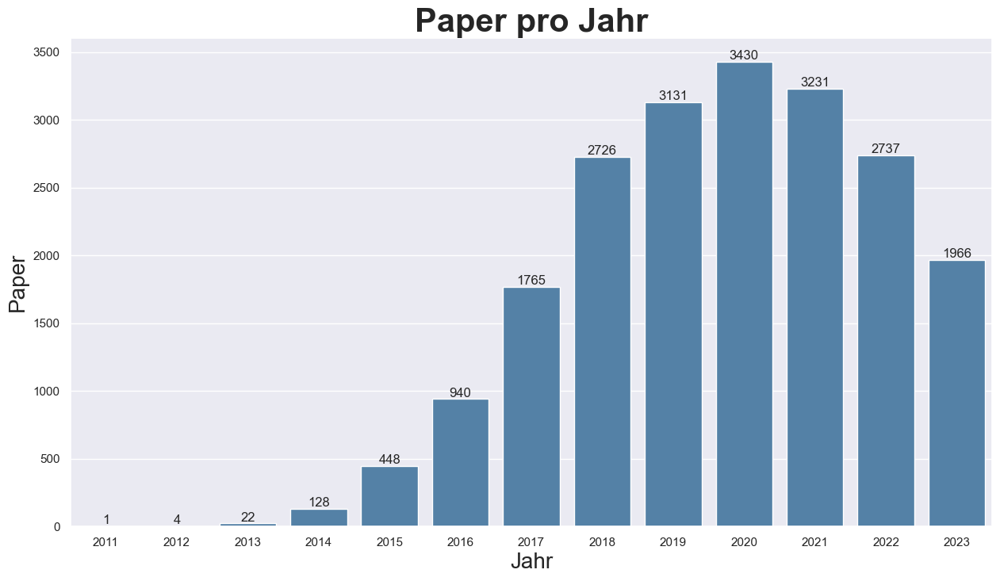

In [22]:
# Größe des Plots festlegen
plt.figure(figsize=(15,8)) 

# Barplot von den Daten erzeugen
ax = sns.barplot(data=df_yearly_papers, # Übergabe der Daten
                 x= "Year", # Jahre auf die X-Achse legen 
                 y= "count", # Anzahl auf die Y-Achse legen
                 color="steelblue") # Farbe der Balken festlegen

plt.xlabel("Jahr", fontsize= 20) # festlegen der X-Label
plt.ylabel("Paper", fontsize= 20) # festlegen der Y-Label
plt.title("Paper pro Jahr",fontsize=30, fontweight="bold") # festlegen des Titels

# Anzeigen der Werte über dem entsprechenden Balken
for i in ax.containers:
    ax.bar_label(i,)
    
plt.show()

Anhand des Balkendiagramms lässt sich erkennen, dass ab 2014 Paper über CNNs massiv zugenommen haben. Das Maximum der veröffentlichten Paper wurde 2020 erreicht und nimmt seit dem wieder stetig ab. Sollte dieser Trend fortgesetzt werden, kann hier in den nächsten Jahren von einer Normalverteilung gesprochen werden. 
___
## 3.3 Paper pro Monat
<a id="3.3"></a>
Die Daten lassen es zu, die zeitliche Komponente weiter aufzuschlüsseln und genauere Erkenntnisse abzuleiten. Somit wird der Verlauf der veröffentlichten Paper im Folgenden über die Monate dargestellt. Hierfür wird eine Monatsspalte zu den Daten hinzugefügt und vorgegangen wie in [Kapitel 3.2](#3.2).
An dieser Stelle wird bewusst mit dem Datentyp "Period" gearbeitet, da dieser die Monate bereits korrekt in Jahren unterscheidet.

In [23]:
# Spalte mit Monaten hinzufügen
df_tmp["Month"] = df_data["Published"].dt.to_period("M")

# Da jeder Titel pro Autor vorkommt, müssen Duplikate erstmal entfernt werden 
df_papers_per_month = df_tmp.drop_duplicates(["Title"])

# nach Monaten gruppieren und Menge ermitteln
df_papers_per_month = df_papers_per_month.groupby("Month").size().reset_index(name = "Amount of Papers")

# Monatsspalte aus temporären DF wieder entfernen
df_tmp = df_tmp.drop("Month", axis=1)

# Anzeigen der ersten drei Datensätze
df_papers_per_month.head(3)

,Month,Amount of Papers
0,2011-02,1
1,2012-04,1
2,2012-06,1


Da evtl. nicht jeden Monat ein Paper veröffentlich wurde, wird eine Range angelegt und die Daten in einem neuen DF gespeichert. Anschließend werden die Daten an der entsprechenden Stelle germerged und die N/A Werte mit nullen gefüllt.

In [24]:
# Dataframe anlegen der eine monatliche Range von dem Minimumdatum bis zum Maximumdatum enthält
df_ppm_merged = pd.DataFrame(pd.date_range(start=df_data["Published"].min(), 
                             end=df_data["Published"].max(), freq= "M").to_period("M"), # Umwandeln in Period (Y/M)
                             columns=["Month"])

# Zusammenfügen der Daten mit dem neu angelegten DF
df_ppm_merged = df_ppm_merged.merge(df_papers_per_month, # zu mergender DF
                                    on="Month", # Spalte über die germerged werden soll
                                    how="left").fillna(0) # nur Keys des linken DF verwenden - anschließend N/A-Werte mit Nullen füllen

<a id="Papers_pro_Monat"></a>

Nach der Transformation und Ergänzung der Daten werden diese über den gesamten Zeitraum in Monatsintervallen dargestellt sowie deskriptive statistische Werte ausgegeben

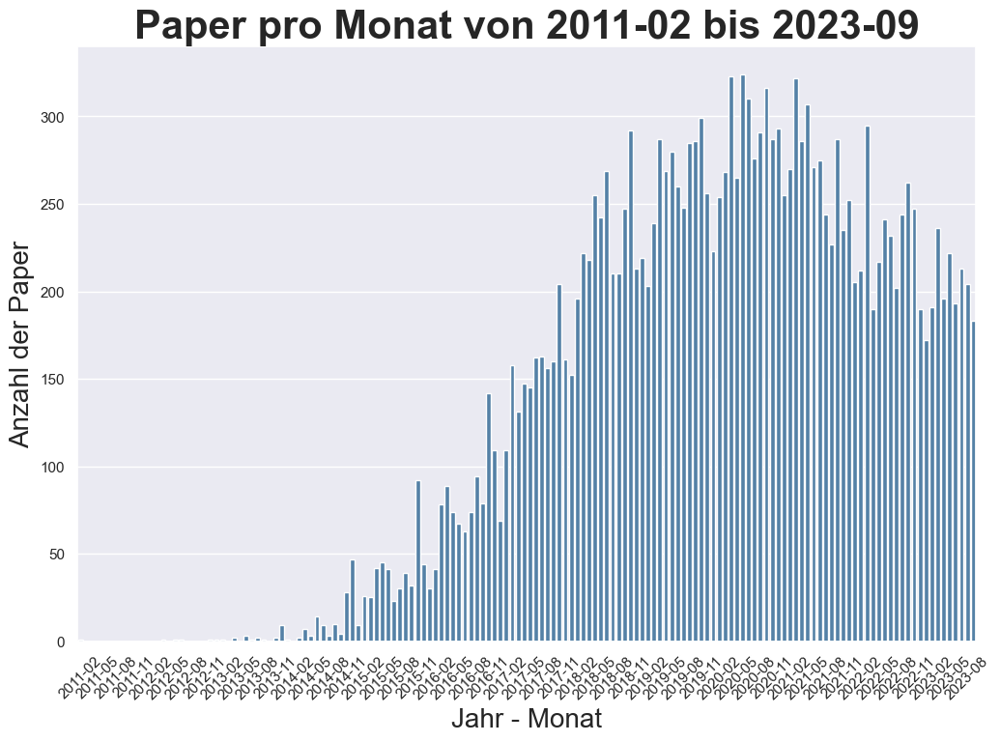

count    152.000000
mean     134.032895
std      114.551496
min        0.000000
25%        3.000000
50%      149.500000
75%      242.500000
max      324.000000
Name: Amount of Papers, dtype: float64


In [25]:
plt.figure(figsize=(12,8)) # Größe des Plots festlegen
plt.xticks(rotation=45) # X-Ticks anwinkeln für bessere Lesbarkeit

# Plotten der Daten über die Monate
ax = sns.barplot(data=df_ppm_merged,
                 x="Month", # Monate auf die X-Achse legen 
                 y="Amount of Papers", # Anzahl auf die Y-Achse legen
                 color="steelblue") # Farbe der Balken festlegen

# x-Label alle 3 Monate anzeigen 
ax.set_xticks([x for x in range(len(df_ppm_merged[0:]))if x % 3 == 0])

# Minimum und Maximum in den Titel integrieren
plt.title('Paper pro Monat von %s bis %s' % (df_ppm_merged["Month"].min(), df_ppm_merged["Month"].max()),
          fontweight="bold",
          fontsize= 30)
plt.xlabel("Jahr - Monat", fontsize= 20)
plt.ylabel("Anzahl der Paper", fontsize= 20)
plt.show()

# Statistische Beschreibung ausgeben
print(df_ppm_merged["Amount of Papers"].describe())

Insgesamt spiegelt der Verlauf über die Monate den Verlauf über die Jahre wieder. Im Mittel wurden jeden Monat 134 Paper veröffentlicht, hierbei gab es ein Maximum von 324. Da es Anfangs viele Monate gibt in denen wenig Paper veröffentlicht wurden, ist die Standardabweichung mit 114,54 relativ hoch. Es zeigt sich auch, dass es immer wieder Monate gibt, in denen scheinbar mehr Paper veröffentlicht werden als in den übrigen Monaten. Um zu überprüfen, ob es Monate gibt in denen besonders oft Paper veröffentlicht wurden, wird im folgenden die Summe der Paper eines Monats über den gesamten Zeitraum ermittelt.  

In [26]:
# Daten kopieren
df_paper_in_month = pd.DataFrame(df_ppm_merged, copy=True)

# Monate nur noch als Monat darstellen
df_paper_in_month["Month"] = df_paper_in_month["Month"].dt.month

# Nach Monaten gruppieren und zusammenzählen
df_paper_in_month = df_paper_in_month.groupby("Month").sum().reset_index(drop=False)

Nach dem Erzeugen bzw. Transformieren der nötigen Daten, können diese foglich geplottet werden.

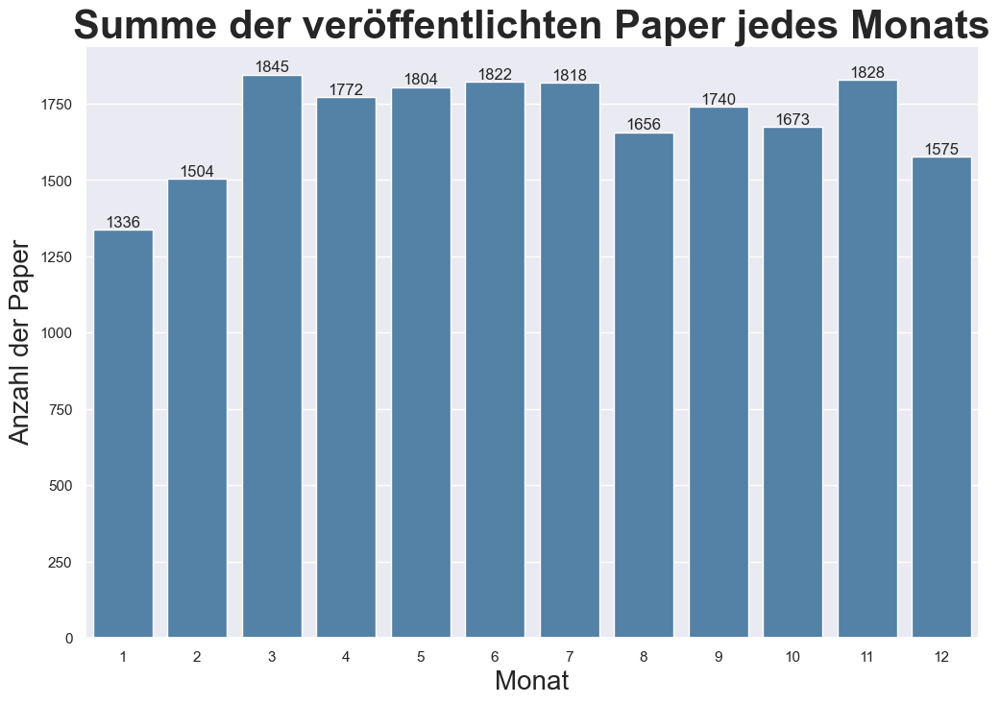

count      12.000000
mean     1697.750000
std       157.525828
min      1336.000000
25%      1635.750000
50%      1756.000000
75%      1819.000000
max      1845.000000
Name: Amount of Papers, dtype: float64


In [27]:
plt.figure(figsize=(12,8)) # Größe des Plots festlegen

# Plotten der Daten
ax = sns.barplot(data= df_paper_in_month,
                 x= "Month", # Monate auf die X-Achse legen 
                 y= "Amount of Papers", # Anzahl auf die Y-Achse legen
                 color="steelblue") # Farbe der Balken festlegen

plt.title("Summe der veröffentlichten Paper jedes Monats", # Titel festlegen
          fontweight="bold", # Fettdruck aktivieren
          fontsize= 30) # Schriftgröße festlegen

plt.xlabel("Monat", fontsize= 20) # X-Label festlegen
plt.ylabel("Anzahl der Paper", fontsize= 20) # Y-Label festlegen

# Anzeigen der Werte über dem entsprechenden Balken
for i in ax.containers:
    ax.bar_label(i,)

plt.show()

# Statistische Beschreibung ausgeben
print(df_paper_in_month["Amount of Papers"].describe())

Es zeigt sich, dass die obere Annahme nur bedingt bestätigt werden kann, da es keine signifikanten Unterschiede gibt. Der Januar ist der schwächste Monat und der März der stärkste Monat in Bezug auf Veröffentlichungen, wobei im März ca. 38% mehr Paper veröffentlicht wurden. Durchschnittlich wurden in jedem Monaten über den gesamten Zeiraum 1698 Paper veröffentlicht.

___
## 3.4 Durchschnittliche Wörter der Summary pro Jahr
In diesem Unterkapitel stehen die Anzahl der Wörter der Summary eines Paper im Fokus. Es soll geprüft und bewertet werden, ob sich die Anzahl der Wörter über die Jahre verändert hat.

In [28]:
# Ausgeben der Summe der Paper
print("\nAnzahl der Paper: %d" %df_data["Summary"].drop_duplicates().shape[0])

# Ausgabe der Summe aller Wörter in den Daten
print("Anzahl aller Wörter: %d" %count_words(df_data["Summary"].drop_duplicates()))

# Ausgabe der durchschnittlichen Anzahl der Wörter pro Paper
print("Anzahl durchschnittlicher Wörter pro Paper: %d" %(count_words(df_data["Summary"].drop_duplicates())/
                                                         df_data["Summary"].drop_duplicates().shape[0]))


Anzahl der Paper: 20534
Anzahl aller Wörter: 3699810
Anzahl durchschnittlicher Wörter pro Paper: 180


Mittels einfacher Mittel lassen bereits einige Informationen extrahieren. Auf 20534 Paper verteilen sich ca. 3.7 Millionen Wörter, was im Mittel 180 Wörter pro Summary ergibt. Nachfolgend wird für jedes Jahr die Anzahl der Wörter errechnet und durch die Anzahl der Paper des Jahres geteilt. Darauffolgend werden die Ergebnisse über die Jahre geplottet.

In [29]:
# neuen DF erzeugen
df_yearly_words = pd.DataFrame()

# für jedes Jahr die Wörter der Paper zählen
for year in range(df_data["Published"].min().year, df_data["Published"].max().year+1, 1):
    # Duplikate entfernen
    n = df_data.drop(df_data[df_data["Published"].dt.year != year].index).drop_duplicates(["Title"])
    # Wörter pro Jahr zählen
    x = pd.DataFrame({"Year":year, "count":count_words(n["Summary"])},index=[0])
    # Ergebnis anhängen
    df_yearly_words = pd.concat([df_yearly_words, x]).reset_index(drop=True)
    
# Durchschnittliche Wörter pro Paper im Jahr ausrechnen
df_yearly_words["count"] = (df_yearly_words["count"]/df_yearly_papers["count"]).astype("int")

Nach der Transformation der Daten können diese wieder nach dem gleichen Schema geplottet werden.

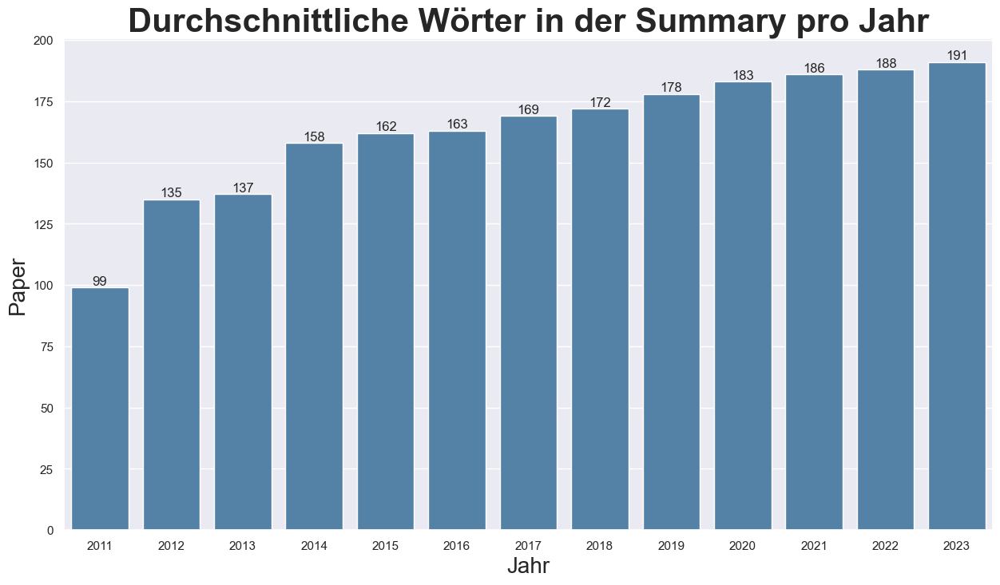

In [30]:
plt.figure(figsize=(15,8))

ax = sns.barplot(data=df_yearly_words,
                 x= "Year",
                 y= "count",
                 color="steelblue")

plt.xlabel("Jahr", fontsize= 20)
plt.ylabel("Paper", fontsize= 20)

plt.title("Durchschnittliche Wörter in der Summary pro Jahr",fontsize=30, fontweight="bold")

for i in ax.containers:
    ax.bar_label(i,)
    
plt.show()

An der oberen Grafik lässt sich erkennen, dass seit 2011 die Anzahl der Wörter innerhalb der Summary stetig steigt. Dabei hat sich die Anzahl von 2011 bis 2023 fast verdoppelt. Setzt man die Anzahl der Wörter mit der Qualität der Summary gleich, lässt sich daraus schließen, dass die Qualität der Summary seit Jahren bessert wird. Es lässt sich aber auch schlussfolgern, dass das Thema mit fortschreitendem Forschungsstand und breiterer Anwendung immer komplexer wird, weshalb somit auch die Komplexität der Summary zunimmt.

___
## 3.5 Autoren pro Jahr
Da die Daten nach Autoren aufgeteilt wurden und es pro Paper jedes Autors auch einen Eintrag gibt, kann anhand der Summe einzelner Titel festgestellt werden, wieviele Autoren pro Paper beteiligt waren. Zusätzlich lässt sich zeigen, in wiefern die Anzahl der Autoren mit der Anzahl der Paper korreliert. 

In [31]:
# Neuen DF mit der Anzahl der Titel (Menge Titel = Menge Autoren) pro Jahr
df_yearly_authors = pd.DataFrame({'count':df_tmp.groupby("Year")["Title"].value_counts()}, copy=True).reset_index()

# Titelspalte kann entfernt werden
df_yearly_authors = df_yearly_authors.drop("Title" ,axis=1)

# Daten nach Jahren Gruppieren und Summe bilden
df_yearly_authors = df_yearly_authors.groupby("Year")["count"].sum().reset_index()

Nachdem die Daten transformiert und entsprechend der Vorgaben extrahiert wurden, können diese geplottet werden. 

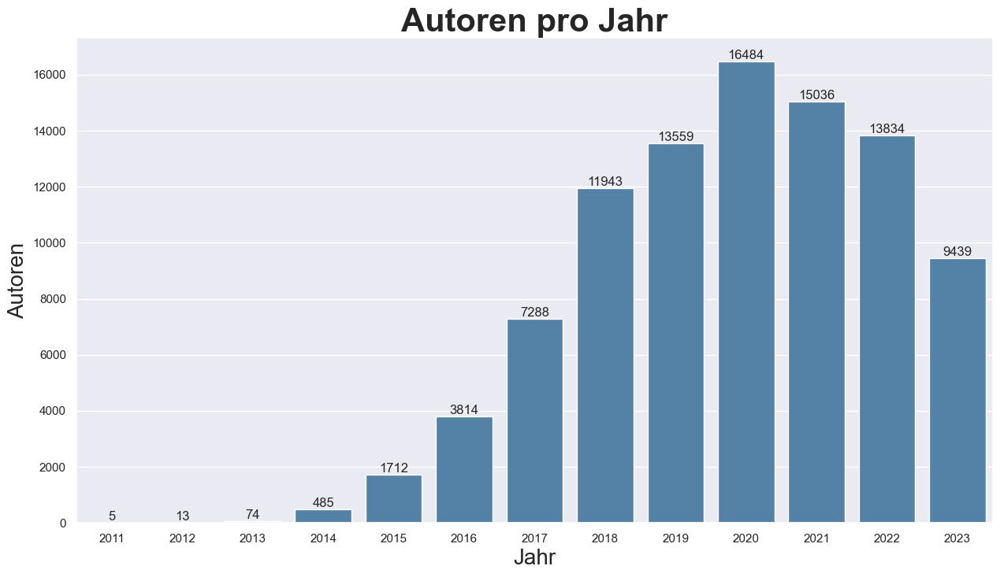

In [32]:
plt.figure(figsize=(15,8))

ax = sns.barplot(data=df_yearly_authors, 
                 x= "Year", 
                 y= "count",
                 color="steelblue")

plt.xlabel("Jahr", fontsize= 20)
plt.ylabel("Autoren", fontsize= 20)

plt.title("Autoren pro Jahr",
          fontsize=30, 
          fontweight="bold")

for i in ax.containers:
    ax.bar_label(i,)
    
plt.show()

Es ist erkennbar, dass die Autoren einen ähnlichen Verlauf wie die Papers pro Jahr haben und ansonsten keine Ausreißer oder ähnliches auffällt. In dem folgenden Lieniendiagramm werden beide Datenreihen zusammen dargestellt, um die Korellation zu prüfen.

In [33]:
# Einfügen eines Merkmals zur Unterscheidung der Datenreihen
df_yearly_authors["kind"] = "authors"
df_yearly_papers["kind"] = "papers"

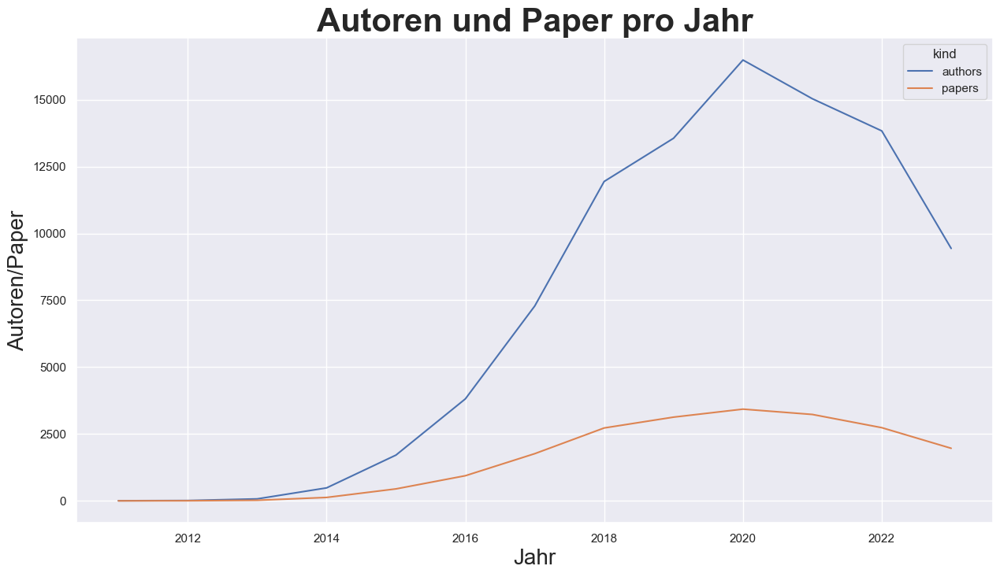

In [34]:
plt.figure(figsize=(15,8))
# Daten konkatenieren und plotten
sns.lineplot(data=pd.concat([df_yearly_authors, df_yearly_papers]), 
             x="Year", 
             y= "count",
             hue="kind", # Daten anhand der Spalte gruppieren
             color="steelblue")
plt.xlabel("Jahr", fontsize= 20)
plt.ylabel("Autoren/Paper", fontsize= 20)

plt.title("Autoren und Paper pro Jahr",
          fontsize=30,
          fontweight="bold")

plt.show()

Beide Kurven folgen einem ähnlichen Verlauf, wobei die Autorenkurve stärker ansteigt und ab 2018 größere Sprünge macht. Dennoch lassen sich eine starke Korrelation und gleiche Tendenzen erkennen, welche mit dem folgenden Relationsplot überprüft wird.

<Figure size 1500x800 with 0 Axes>

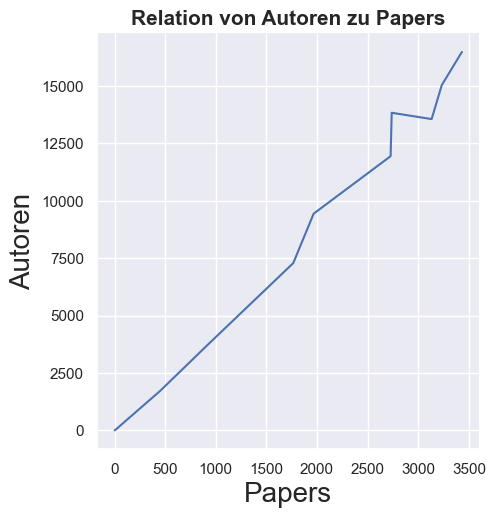

In [35]:
plt.figure(figsize=(15,8))
# Zusammenführen beider DFs, wobei NA-Werte mit Nullen ersetzt werden, und anschließendes Plotten
sns.relplot(data=df_yearly_papers.merge(df_yearly_authors, on="Year", how="left").fillna(0), 
            x="count_x", 
            y="count_y", 
            kind="line")

plt.xlabel("Papers", fontsize= 20)
plt.ylabel("Autoren", fontsize= 20)

plt.title("Relation von Autoren zu Papers",fontsize=15, fontweight="bold")

plt.show()

Anhand der oberen Grafik kann eine positiven Korrelation erkannt werden bzw. sind beide Werte weitesgehend linear abhängig, auch wenn es hier leichte Ausschläge gibt. Der sprunghafte Anstieg der Autoren lässt sich durch das Paper mit 1224 Autoren begründen. Erwartungsgemäß korreliert also die Anzahl der Autoren pro Jahr sehr stark mit den Papers pro Jahr. Somit wird auf die eine tiefere Darstellung der Autoren über die Monate verzichtet, da davon auszugehen ist, dass sich ein ähnliches Bild ergibt wie in [3.3 Papers pro Monat](#3.3).

___
## 3.6 Beteiligte Autoren pro Paper
Nachfolgend soll untersucht werden, wie viele Autoren jedes Paper besitzt und ob es hierbei Ausreißer oder andere Auffälligkeiten gibt.

In [36]:
# Anzahl der Autoren pro Paper ermitteln
s_top_paper = df_data.value_counts("Title")

In [37]:
# Extremwert in den Daten vorhanden
print("Anzahl der Papers: ", len(s_top_paper))
print("\nTop 10 Papers\n",s_top_paper.head(10))

Anzahl der Papers:  20529

Top 10 Papers
 Title
Separation of track- and shower-like energy de...    1224
Neutrino interaction classification with a con...     971
A Convolutional Neural Network based Cascade R...     367
Event reconstruction for KM3NeT/ORCA using con...     232
Euclid Preparation TBD. Characterization of co...     219
Cosmic ray muon clustering for the MicroBooNE ...     191
A Convolutional Neural Network for Multiple Pa...     187
Semantic Segmentation with a Sparse Convolutio...     183
A Deep Neural Network for Pixel-Level Electrom...     173
Convolutional Neural Networks Applied to Neutr...     139
dtype: int64


Anhand der ersten 10 Paper lassen sich bereits erste Informationen identifizieren. Mit 1224 und 971 Autoren stechen zwei Paper klar hervor und lassen sich als Ausreißer identifizieren.

In [38]:
# Statistische Beschreibung ausgeben
print("Vorkommende Werte: ", s_top_paper.nunique())
print(s_top_paper.describe())

Vorkommende Werte:  61
count    20529.000000
mean         4.563593
std         12.095508
min          1.000000
25%          3.000000
50%          4.000000
75%          5.000000
max       1224.000000
dtype: float64


Insgesamt gibt es 61 unterschiedliche Mengen, wobei im Durchschnitt 4 bis 5 Autoren an einem Paper beteiligt sind. Die Standardabweichung liegt bei 12.1. Erwartungsgemäß liegt das Minimum bei 1 und das Maximum stellt den bereits identifizierten Ausreißer mit 1224 dar. Nachfolgend wird die Haufigkeit der beteiligten Autoren ermittelt und ausgewertet.

In [39]:
# Zählen der Häufigkeit von Papers mit x Autoren
data = s_top_paper.value_counts()

# Anlegen und befüllen eines Dataframes, der die Anzahl des Auftretens von x Autoren ermittelt und speichert
df_top_papers = pd.DataFrame({"Autoren": data.index,
                              "Anzahl Paper": data.values}).sort_values(by="Autoren", ignore_index=True)

Nach der Ermittlung der Informationen werden diese in einem Balkendiagramm dargestellt. 

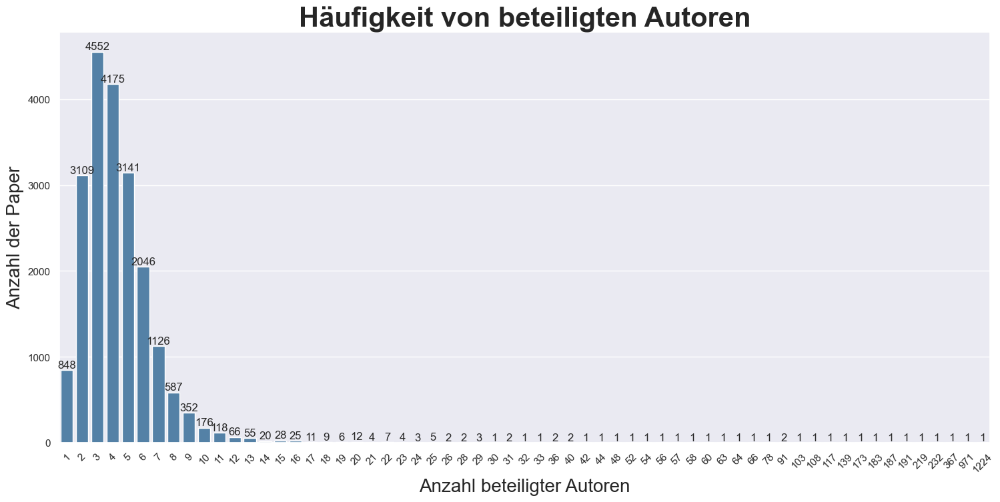

count      61.000000
mean      336.540984
std       978.693510
min         1.000000
25%         1.000000
50%         2.000000
75%        20.000000
max      4552.000000
Name: Anzahl Paper, dtype: float64

In [40]:
# Plotten der Daten
plt.figure(figsize=(18,8))
plt.xticks(rotation=45) # X-Ticks anwinkeln für bessere Lesbarkeit

ax=sns.barplot(data=df_top_papers,
            x="Autoren",
            y="Anzahl Paper",
            color="steelblue",
            errorbar=None)
plt.xlabel("Anzahl beteiligter Autoren", fontsize= 20)
plt.ylabel("Anzahl der Paper", fontsize= 20)
plt.title("Häufigkeit von beteiligten Autoren",
          fontsize=30,
          fontweight="bold")

for i in ax.containers:
    ax.bar_label(i,)

plt.show()

# Statistische Beschreibung anzeigen
df_top_papers["Anzahl Paper"].describe()

Anhand des Diagramms lässt sich klar erkennen, dass der Großteil der Paper zwischen 1 bis 16 Autoren besitzt, wobei im Maximum 4552 Paper 3 Autoren besitzen. Im Schnitt hat jede Autorenmenge 336 bis 337 Paper veröffentlicht. Hierbei ist die Standardabweichung mit 978.7 jedoch sehr hoch, was auf die Ausreißer bzw. die Spannweite zurückzuführen ist. Auffällig ist die Konzentration der Verteilung auf das erste Viertel, weshalb es an dieser Stelle sinnvoll ist ein Clipping durchzuführen und die Ausreißer zu begrenzen ohne sie zu entfernen. Dafür wird der Schwellenwert auf 22 Autoren gesetzt und damit auf ca. 1/3 der Spannweite reduziert. Nach 22 Autoren treten nur noch hauptsächlich Werte gegen 1 auf und es ist davon auszugehen, dass es sich um Gemeinschaftsprojekte handelt, wie bereits oben konstatiert.

In [41]:
# neuen DF für geclippte Daten anlegen
df_top_papers_clipped = pd.DataFrame(df_top_papers, copy=True)

# Alle Autorenmengen über 22 auf 22 festsetzen
df_top_papers_clipped["Autoren"] = [min(x, 22) for x in df_top_papers["Autoren"]]

# neu nach der Autorenmenge gruppieren, um die dazugekommenen Werte der 22 zuzuordnen
df_top_papers_clipped = df_top_papers_clipped.groupby("Autoren").sum().reset_index()

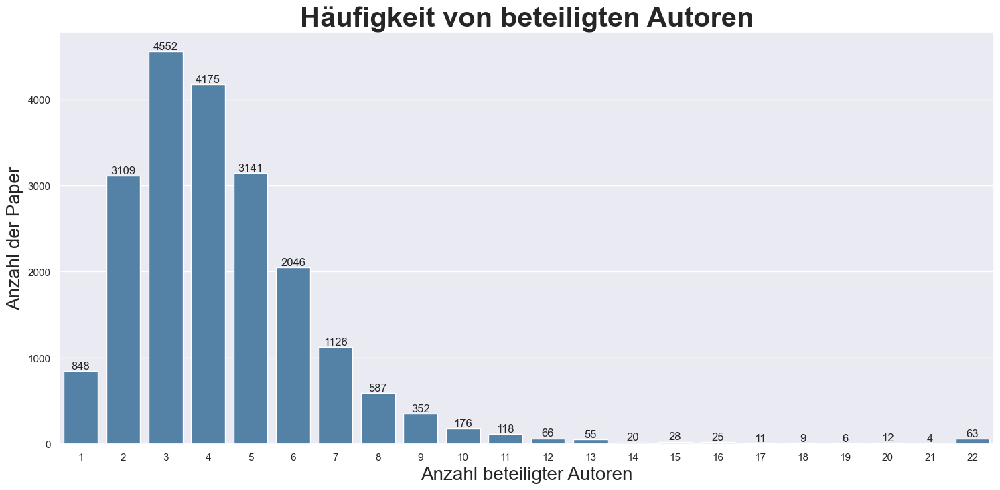

count      22.000000
mean      933.136364
std      1467.533736
min         4.000000
25%        21.250000
50%        92.000000
75%      1056.500000
max      4552.000000
Name: Anzahl Paper, dtype: float64

In [42]:
# Plotten der Daten
plt.figure(figsize=(18,8))

ax=sns.barplot(data=df_top_papers_clipped,
            x="Autoren",
            y="Anzahl Paper",
            color="steelblue")
plt.xlabel("Anzahl beteiligter Autoren", fontsize= 20)
plt.ylabel("Anzahl der Paper", fontsize= 20)
plt.title("Häufigkeit von beteiligten Autoren",
          fontsize=30,
          fontweight="bold")

for i in ax.containers:
    ax.bar_label(i,)

plt.show()

# Statistische Beschreibung anzeigen
df_top_papers_clipped["Anzahl Paper"].describe()

Die Spannweite hat sich nun auf 22 reduziert und der Mittelwert auf 933 Paper pro beteiligter Autoren erhöht, bei einer Standardabweichung von 1467.5. Diese Werten bilden die Realität wesentlich besser ab, als es vor dem Clipping der Fall war. Anhand der folgenden Boxplots wird noch einmal die Funktion des Clippings ersichtlich. Nach dem Clipping sind alle Ausreißer entfernt und es lassen sich bessere und realistischere Aussagen über die Daten treffen.

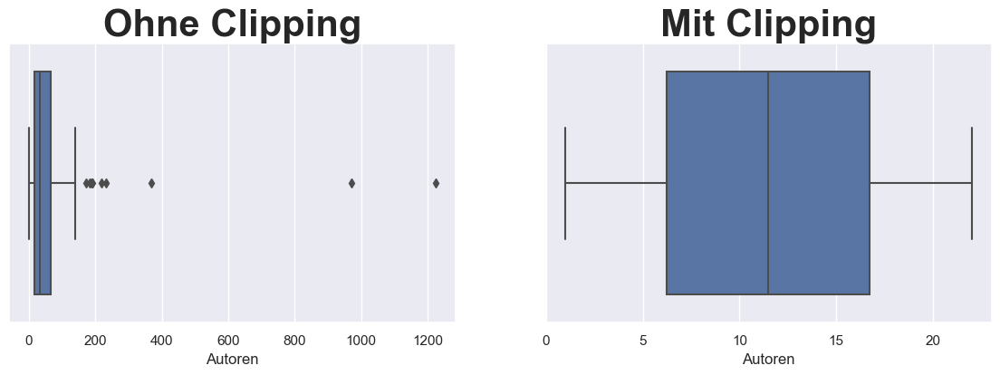

In [43]:
# Plotten von Box-Plots um Ausreißer zu visualisieren
plt.figure(figsize=(14,4))

# plotten mit Ausreißer
plt.subplot(1,2,1)
plt.title("Ohne Clipping",
          fontsize=30, 
          fontweight="bold")
sns.boxplot(data=df_top_papers,
            x=df_top_papers["Autoren"])   

# plotten ohen Ausreißer
plt.subplot(1,2,2)
plt.title("Mit Clipping",
          fontsize=30, 
          fontweight="bold")
sns.boxplot(data=df_top_papers_clipped,
            x=df_top_papers_clipped["Autoren"])   

plt.show()

Es ist deutlich zu erkennen, wie die Ausreißer die Daten beeinträchtigen. Nach dem Clipping ergibt sich ein wesentlich harmonischeres Bild und die Daten lassen besser auswerten.
___

<b> Weitere Datentransformation bzw. Transformation von kategorialen Daten </b><br>
Für die weiteren Auswertungen müssen die Daten zusätzlich transformiert werden. Dies wird durch den folgenden Code umgesetzt. Dabei wird ein neuer Dataframe erzeugt, der die Titel der Paper fokussiert. Es tauchen also die Autoren nicht mehr einzelnd auf, sondern es wird ihre oben ermittelte Anzahl pro Paper gespeichert. Zusätzlich werden nicht mehr benötigte Spalten entfernt (Summary, Published).  

In [44]:
# Published und Summary entfernen, da sie nicht gebraucht werden
df_cleaned = pd.DataFrame(df_tmp.drop({"Summary", "Published"}, axis = 1), copy=True)

Anschließend werden die Autoren pro Paper ermittelt und die Daten so transformiert, dass es pro Paper nur noch einen Eintrag gibt, der anstatt Autorennamen nun die Menge der beteiligten Autoren enthält.

In [45]:
#Autoren pro Buch zählen
df_author_cnt = df_cleaned.groupby("Title")["Author"].count().reset_index()

In [46]:
# Alle Bücher einzeln auflisten aber restliche Werte (außer Author) beibehalten
df_cleaned = df_cleaned.drop_duplicates("Title").sort_values("Title").reset_index(drop=True)

In [47]:
# Anzahl der Autoren pro Paper speichern
df_cleaned["Author"] = df_author_cnt["Author"]

# Ergebnis anhand des ersten Datensatzes prüfen
df_cleaned.head(1)

,Author,Title,Primecategory,Affiliation,doi,journal_ref,Comment,Year
0,2,"""Just Drive"": Colour Bias Mitigation for Seman...",cs.CV,no affiliation,no doi,no journal ref,2021 IEEE International Conference on Big Data...,2021


___
## 3.7 Top10 Kategorien über die Jahre
Ein weiteres wichtiges Merkmal ist die Kategorie. Nachfolgend soll überprüft werden, welche die Top-Kategorien sind und wie sie sich im Laufe der Jahre verändert haben.  

In [48]:
# Zählen der vorhandenen Kategorien
s_top_cat = df_cleaned.value_counts("Primecategory")

# Kurzinfo über die Kategorien ausgeben
print("Anzahl unterschiedlicher Kategorien: ", len(s_top_cat))
print("\nTop 10 Kategorien")
s_top_cat.head(10)

Anzahl unterschiedlicher Kategorien:  114

Top 10 Kategorien


Primecategory
cs.CV          9587
cs.LG          2501
eess.IV        2073
eess.SP         674
cs.CL           563
cs.SD           400
cs.RO           383
stat.ML         288
eess.AS         282
astro-ph.IM     249
dtype: int64

Wie zu Beginn des [Kapitel 3](#3) bereits in der statistischen Zusammenfassung der Daten festgestellt, ist die Kategorie cs.CV(9587) die mit Abstand am meisten genannte Hauptkategorie. An zweiter Stelle steht cs.LG (2501), was für computer science - machine learning steht. Daran schließt sich eess.IV(2073), welches wiederum für electrical engineering and system science - image and video processing steht. Anhand der ersten drei Hauptkategorien, welche mit Abstand am meisten genannt werden, lässt sich erkennen, dass die erhaltenen Daten thematisch deckungsgleich mit dem übergebenen Thema CNN sind und somit die korrekten Daten von der API geliefert wurden. Ingesamt werden 114 unterschiedliche Kategorien verwendet. <br>
Im folgenden Code werden die Top10 Kategorien in einem eigenen Dataframe abgelegt und ihr Verlauf über die Jahre visualisiert bzw. vorher ermittelt. 

In [49]:
# Top10 Kategorien auszählen und übergeben
df_category = df_cleaned["Primecategory"].value_counts().nlargest(10)

# Häufigkeit der Kategorien über die Jahre ermitteln
df_tmp = df_cleaned.groupby(["Primecategory","Year"]).size().reset_index(name="Amount of Category")

# Index der Top10 Kategorien ermitteln
index_top10_c = df_cleaned.Primecategory.value_counts().nlargest(10).index

# Filtern der Top10 Kategorien und diese im eigenen Dataframe speichern 
df_top10_c = df_tmp[df_tmp["Primecategory"].isin(df_cleaned.Primecategory.value_counts().nlargest(10).index)]

Da alle 10 Kategorien über die Jahre dargestellt werden sollen, um sie zu vergleichen, bietet sich ein Liniendiagramm an. Dieses ermöglicht das direkte Vergleichen bzw. Übereinanderlegen der Kurven, womit diese optisch besser erfasst werden können. 

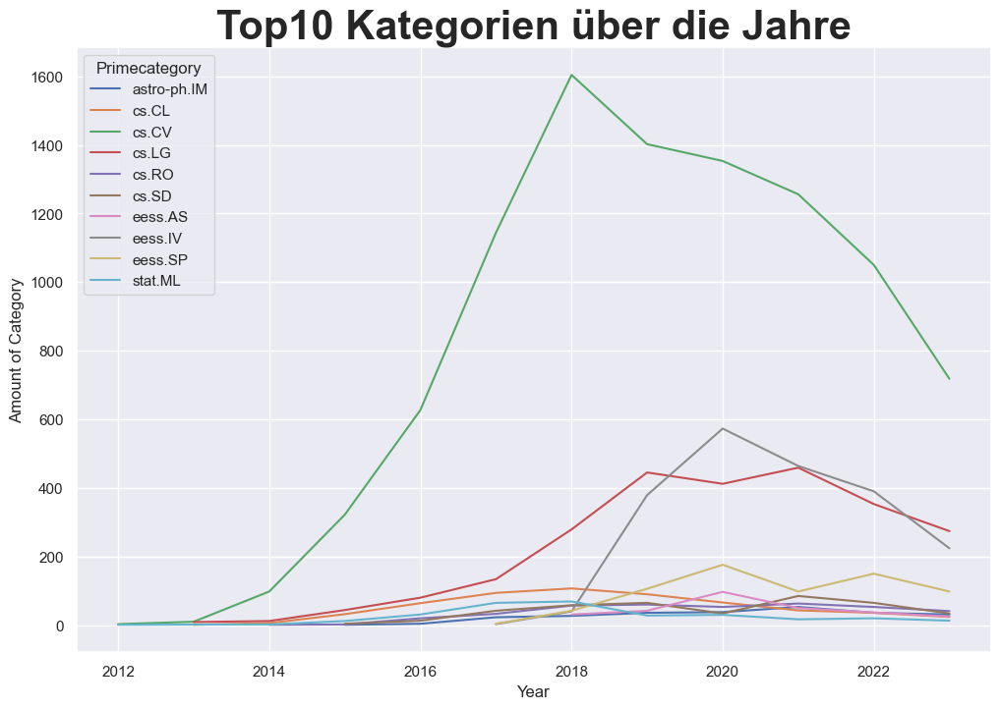

In [50]:
# Daten plotten
plt.figure(figsize=(12,8))
sns.lineplot(data = df_top10_c, # Daten übergeben
             x = "Year", # X-Achse festlegen
             y = "Amount of Category", # Y-Achse festlegen
             hue= "Primecategory") # nach Kategorien aufteilen
plt.title("Top10 Kategorien über die Jahre", # Titel festlegen
          fontsize=30, # Schriftgröße festlegen
          fontweight="bold") # Fettddruck aktivieren
plt.show()

Anhand des Kurvenverlaufs lässt sich deutlich erkennen, dass von 2013 bis 2018 cs.CV hauptsächlich als Kategorie verwendet wurde. Ab 2014 gab es immer mehr Paper mit der Kategorie machine learning(cs.LG). Seit 2018 stieg die Verwendung der Kategorie image and video processing(eess.IV) massiv an, wobei gleichzeitig computer vision seitdem stark abnimmt. Der Anstieg von eess.IV lässt sich höchstwahrscheinlich mit dem Voranschreiten der Forschung und der steigenden verfügbaren Rechenleistung erklären. Hier gab es immer bessere Möglichkeiten CNNs praktisch sowie breitflächiger einzusetzen, weshalb es immer mehr Paper in dieser Kategorie gab. Seit 3 bis 5 Jahren fallen aber wieder alle Kategorien, was mit dem Abfall der veröffentlichten Paper in [Kapitel 3.2 Paper pro Jahr](#3.2) zu erklären ist. Seit 2017 ist die Verwendung von signal processing (eess.SP) leicht angestiegen, aber die Kategorie scheint seit 2020 insgesamt einem Abwärstrend zu folgen. Gleichzeitig sticht keine weitere Kategorie mit einem Anstieg oder ähnlichem heraus.
___
## 3.8 Verteilung der Hauptkategorien

Alle Kategorien sind in eine Hauptkategorie sowie eine Unterkategorie eingeteilt. Diese werden durch einen Punkt getrennt.  Im folgenden soll die Verteilung der Haupkategorien analysiert werden, um zu prüfen, ob es hier Besonderheiten gibt. Dieser Schritt ist auch damit zu begründen, dass 114 Kategorien nur schwer und unübersichtlich darstellbar sind und sich die Menge der Kategorien stark vermindert nach der Aufteilung.

In [51]:
# Datenspalte kopieren
df_cat = pd.DataFrame(df_cleaned["Primecategory"], copy=True)

# Daten am Punkt splitten und nur die erste Hälfte ablegen
df_cat["Primecategory"] = df_cat["Primecategory"].str.split(".").str[0]

In [52]:
# Anzahl der einzelnen Kategorien ermitteln und in neue Spalte schreiben 
df_cat =df_cat.value_counts().groupby("Primecategory").sum().reset_index(name="count").sort_values("count",
                                                                                                   ascending=False, # absteigend sortieren
                                                                                                   ignore_index=True)

In [53]:
# Ausgabe der Kategorien
print(df_cat)

   Primecategory  count
0             cs  14938
1           eess   3074
2       astro-ph    681
3        physics    653
4           stat    311
5       cond-mat    242
6          q-bio    232
7       quant-ph    111
8           math     87
9         hep-ph     56
10         q-fin     41
11        hep-ex     37
12         gr-qc     34
13       nucl-th     10
14       hep-lat      8
15          nlin      6
16          econ      4
17        hep-th      3
18       nucl-ex      1


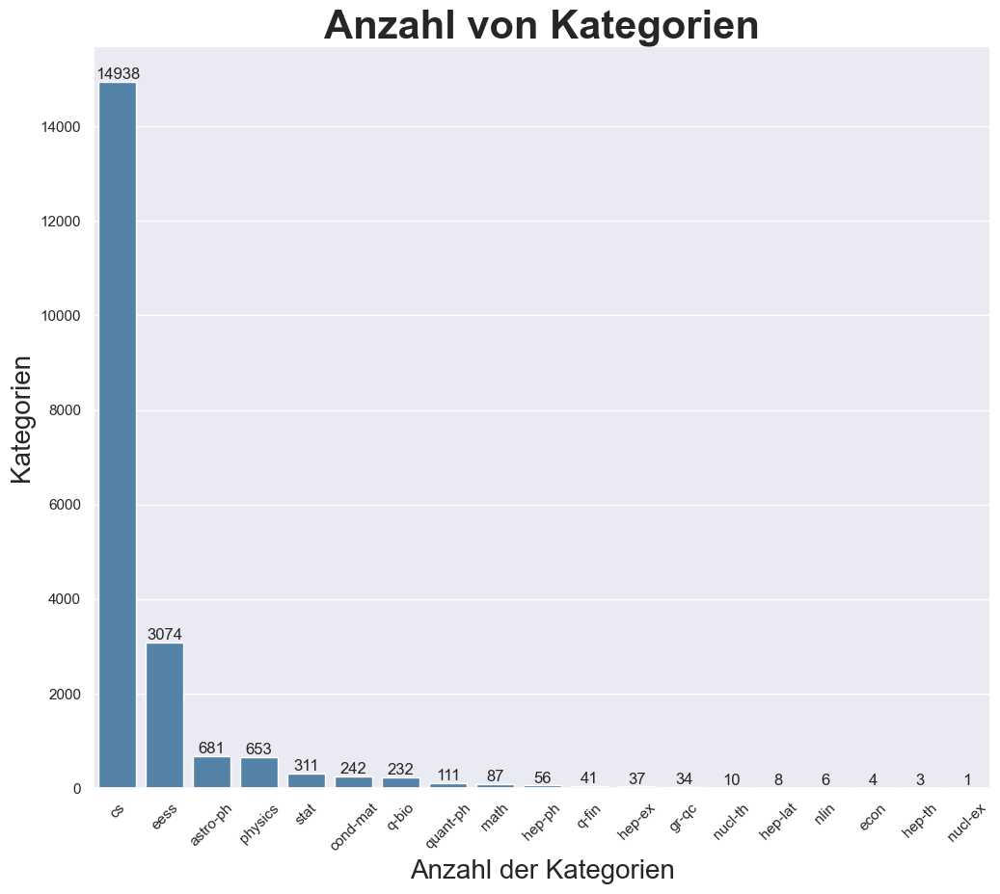

,count
count,19.000000
mean,1080.473684
std,3428.143430
min,1.000000
25%,9.000000
50%,56.000000
75%,276.500000
max,14938.000000


In [54]:
# PLotten der Kategorien
plt.figure(figsize=(12,10))

# Balkendiagramm erzeugen
ax = sns.barplot(data=df_cat, # Kategorien übergeben
                 x="Primecategory", # Y-Achse festlegen
                 y="count", # X-Achse festlegen
                 color="steelblue") # Balkenfarbe festlegen
 
plt.xticks(rotation=45) # X-Ticks anwinkeln für bessere Lesbarkeit
plt.xlabel("Kategorien", fontsize= 20) # X-Achsenbeschriftung
plt.ylabel("Anzahl der Kategorien", fontsize= 20) # Y-Achsenbeschriftung

plt.title("Anzahl von Hauptkategorien", # Titel festlegen
          fontsize=30, # Schriftgröße festlegen
          fontweight="bold") # Fettddruck aktivieren

# Anzahl der Häufigkeit des entsprechenden Kategorie an den Balken anfügen
for n in ax.containers:
    ax.bar_label(n,)
plt.show()

# Statistische Zusammenfassung der numerischen Spalten
df_cat.describe()

Wie sich bereits in dem vorherigen Kapitel erahnen ließ, ist die Kategorie computer science mit Abstand am meisten verwendet wurden (14938). Electrical engineering and system science ist erwartungsgemäß an zweier Stelle. Es lässt sich auch erkennen, dass in der Physik sowie Astro- und Quantenphysik CNNs relativ häufig verwendet werden. Dies gilt auch für die Statistik und Materialforschung sowie der Biologie. Abschließend lässt sich sagen, dass CNNs in vielen Bereichen der klassischen MINT-Fächer verwendet werden bzw. mit ihnen geforscht wird. <br>
Im Schnitt wurden 1080 Paper pro Kategorie veröffentlicht, wobei die Standardabweichung 3428.1 beträgt.

___
## 3.9 Änderungen der Journalreferenzen, Kommentare und Affiliation über die Jahre
In diesem Unterkapitel soll überprüft werden, ob sich die Angaben in den Spalten journal_ref, Comment und Affiliation über die Jahre verändert haben. Dabei wird nicht der Kontext des Inhalts überprüft, sondern ob die entsprechende Zelle mit Inhalt befüllt wurde oder nicht. Hierzu werden die Angaben mittels der apply-Methode über eine einfache Lambda-Funktion entlang der Zeilen transformiert. Diese wandelt entsprechend dem Inhalt die Werte in no und yes um.

In [55]:
# Journalreferenzen über die Jahre auszählen

# Neuen Dataframe erstellen und die Jahre sowie die entsprechenden Zählwerte in Spalte count eintragen
df_yearly_journalref = pd.DataFrame({'count':df_cleaned.groupby("Year")["journal_ref"].value_counts()},
                                    copy=True).reset_index()

# Umwandeln der Werte in no und yes
df_yearly_journalref["journal_ref"] = df_yearly_journalref["journal_ref"].apply(lambda x: "no" if x == "no journal ref" else "yes")

# Daten nach Jahren und journal_ref gruppieren sowie summieren der Werte
df_yearly_journalref = df_yearly_journalref.groupby(["journal_ref","Year"]).sum().sort_values("Year").reset_index()

In [56]:
# Kommentare über die Jahre auszählen

# Neuen Dataframe erstellen und die Jahre sowie die entsprechenden Zählwerte in Spalte count eintragen
df_yearly_comments = pd.DataFrame({'count':df_cleaned.groupby("Year")["Comment"].value_counts()},
                                  copy=True).reset_index()

# Umwandeln der Werte in no und yes
df_yearly_comments["Comment"] = df_yearly_comments["Comment"].apply(lambda x: "no" if x == "no comment" else "yes")

# Daten nach Jahren und Comment gruppieren sowie summieren der Werte
df_yearly_comments = df_yearly_comments.groupby(["Comment","Year"]).sum().sort_values("Year").reset_index()

In [57]:
# Affiliation über die Jahre auszählen

# Neuen Dataframe erstellen und die Jahre sowie die entsprechenden Zählwerte in Spalte count eintragen
df_yearly_affiliations = pd.DataFrame({'count':df_cleaned.groupby("Year")["Affiliation"].value_counts()},
                                      copy=True).reset_index()

# Umwandeln der Werte in no und yes
df_yearly_affiliations["Affiliation"] = df_yearly_affiliations["Affiliation"].apply(lambda x: "no" if x == "no affiliation" else "yes")

# Daten nach Jahren und Affiliation gruppieren sowie summieren der Werte
df_yearly_affiliations = df_yearly_affiliations.groupby(["Affiliation","Year"]).sum().sort_values("Year").reset_index()

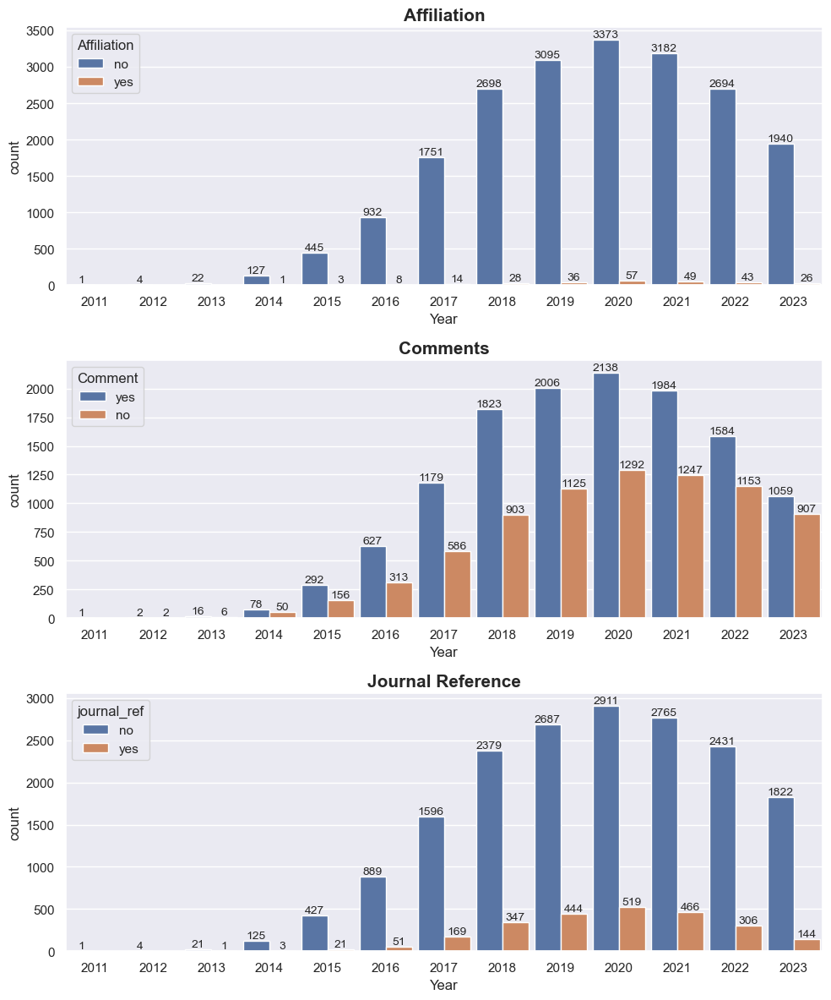

In [58]:
# PLotten der Ergebnisse in drei Balkendiagramme
fig, axes = plt.subplots(3,1, figsize=(10,12))

# PLotten der Affiliation
ax = sns.barplot(data=df_yearly_affiliations, 
                 x='Year',
                 y='count',
                 hue = "Affiliation", 
                 ax=axes[0], # Achse auf die geplottet werden soll
                 width=0.9) # Balkenbreite festlegen
ax.set_title("Affiliation", fontsize=15, fontweight="bold")
sns.move_legend(axes[0], "upper left") # Position der Legende der Achse festlegen
# Werte an Balken anfügen
for i in ax.containers:
    ax.bar_label(i, fontsize=10)

    
# PLotten der Comments
ax =  sns.barplot(data=df_yearly_comments, 
                  x='Year',
                  y='count',
                  hue = "Comment",
                  ax=axes[1], # Achse auf die geplottet werden soll
                  width=0.9) # Balkenbreite festlegen
ax.set_title("Comments", fontsize=15, fontweight="bold")
sns.move_legend(axes[1], "upper left") # Position der Legende der Achse festlegen
# Werte an Balken anfügen
for i in ax.containers:
    ax.bar_label(i,fontsize=10)

    
# Plotten der Journal Reference
ax =  sns.barplot(data=df_yearly_journalref, 
                  x='Year',
                  y='count',
                  hue = "journal_ref", 
                  ax=axes[2], # Achse auf die geplottet werden soll
                  width=0.9) # Balkenbreite festlegen
ax.set_title("Journal Reference", fontsize=15, fontweight="bold")
sns.move_legend(axes[2], "upper left") # Position der Legende der Achse festlegen
# Werte an Balken anfügen
for i in ax.containers:
    ax.bar_label(i,fontsize=10)

# Layout anpassen
plt.tight_layout(w_pad = 10)

<b> Affiliation:</b> Eine Affiliation besteht nur in den wenigstens Fällen. Hier lassen sich keine Auffälligkeiten oder Änderungen über die Jahre erkennen. 

<b> Comments:</b> Bis 2021 bleibt das Verhältnis zwischen unkommentierten und kommentierten Paper relativ stabil. Erst ab dem Jahr 2022 fällt auf, dass sich das Verhältnis ändert und immer mehr Paper keinen Kommentar enthalten. Rückschlüsse auf die Ursache lassen sich jedoch nicht ziehen

<b> Journal Reference:</b> Wie bei der Affiliation bleibt auch hier das Verhältnis von yes zu no durchgehend gleich. Es treten also keine Auffälligkeiten auf. Hier kann von einem linearen Zusammenhang gesprochen werden.

Abschließend kann gesagt werden, dass bis auf immer mehr unkommentierte Paper keine signifikanten Änderungen über die Jahre auftreten und das die Werte linear mit der Anzahl der Paper korelliert.

<b>___________________________________________________________________________________________________________________________</b>

# 4. Data Mining auf unstrukturierte Daten
<a id="4"></a>
In diesem Kapitel wird ein Topicmodelling mittels der Latent Dirichlet Allocation (LDA) durchgeführt. Als Basis dient die Summary-Spalte, welche tokeniziert und normalisiert wird und anschließend die Trainignsdaten für das LDA-Modell bildet. Somit werden Topics extrahiert, die zeigen, in welchen Gebieten CNNs verwendet werden.

In [ ]:
# Topic-Modelling Bib und entsprechende Module laden
import gensim
from gensim.utils import simple_preprocess
from gensim.models import LdaModel, CoherenceModel
from gensim.corpora import Dictionary
import gensim.corpora as corpora

# Laden der Bib für regular Expressions
import re

# Modul für NLP-Funktionen/die Lemmatisierung
import spacy

# NLTK Stop words
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
# Englische Stopwörter laden
stop_words = stopwords.words('english')

Um eine bessere Übersicht zu gewährleisten, werden im folgenden etliche Funktionen erstellt, die zur Durchführung des Topicmodellings notwendig sind und den Code einfacher machen sowie lesbarer gestalten sollen.
___
<b>replace</b><br>
Viele der Paper sind in den meisten Fällen mit LaTeX geschrieben. Dies hat zur Folge, dass die Summary eine Vielzahl von LaTeX-Notationen enthält, die entfernt werden müssen. Zusätzlich kann die Summary auch HTML-Elemente und Sonderzeichen enthalten, welche ebenfalls störend für das Modell sind. Um diese zu entfernen wird im folgenden eine Funktion erstellt, die mit regulären Ausdrücken arbeitet. Hierfür bietet sich die sub-Methode des __[re-Moduls](https://docs.python.org/3/library/re.html)__ an, welche bestimmte Ausdrücke ersetzt. Dabei wird über den String "\W+" festgelegt, dass nach nicht alphanumerischen Zeichen gesucht wird, wobei mindestens eines dieser Zeichen enthalten sein muss. Ersetzt werden die Zeichen mit einem Leerzeichen und es werden alle Funde ersetzt. Hierbei wird die Groß- und Kleinschreibung ignoriert.

In [60]:
# Entfernen von Sonderzeichen (regular expressions) und Zeichensetzung
def replace(text):
    return re.sub("\W+", ' ',text,0,re.IGNORECASE)

___
<b>remove_stopwords</b><br>
Um die Stopwörter zu entfernen wird das __[nltk-Modul](https://www.nltk.org/)__ verwendet. Dieses bietet bereits eine vollständige Liste von Stopwörtern in englischer Sprache an. Dabei wird jedes Wort in der Summary jedes Paper analysiert und überprüft, ob es ein Stoppwort ist. Wenn dies nicht der Fall ist, wird es durch die __[simple_preprocess-Methode](https://tedboy.github.io/nlps/generated/generated/gensim.utils.simple_preprocess.html)__ tokenisiert und zurückgegeben. 

In [61]:
# Entfernen der Stopwörter
def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]

___
<b>lemmatization</b><br>
Um die Wörter du lemmatisieren wird das __[spacy-Modul](https://spacy.io/)__ verwendet, welches bereits etliche NLP-Funktionen zur Verfügung stellt. Es wird ein vortrainiertes Modell geladen, um englische Wörter korrekt zu lemmatisieren. Dabei wird bewusst der Parser und die Entitiy Recognition deaktiviert, um effizienter zu arbeiten. Anschließend werden die Daten sukzessive dem Modell übergeben, welches prüft, ob diese eine der erlaubten postags(Nomen, Verben etc.) besitzen und bei positivem Ergebnis diese lemmatisiert.

In [62]:
#Lemmatisieren der Wörter
def lemmatization(texts, allowed_postags):
    nlp = spacy.load("en_core_web_sm", # Laden von vortrainiertem Modell 
                     disable=['parser', 'ner']) # Parser und Entity Recognition deaktivieren
    texts_out = [] # leere Liste initialisieren
    
    # Wörter lemmatisieren 
    for sent in texts:
        # alle token mit Leerzeichen verbinden
        doc = nlp(" ".join(sent)) 
        # token lemmatisieren wenn sie zu den erlaubten postags gehören
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

___
<b>data_normalization</b><br>
In dieser Funktion werden die oben erläuterten Methoden in einer bestimmten Reihenfolge auf die eingegebenen Daten durchgeführt (Pipeline). Dabei werden die Daten tokenisiert und normalisiert sowie in Form einer Liste zurückgegeben. 

In [63]:
# Pipeline für das Preprocessing bzw. Normalisierung der Daten
def data_normalization(data):
    # Regex entfernen
    data = data.apply(replace)  
    # Stoppwörter entfernen
    data = remove_stopwords(data)   
    # Lemmatisieren der Wörter und nur Nomen, Adjektive, Verben und Adverben erhalten
    data = lemmatization(data, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])        
    return list(data)

___
<b>compute_model_coherence</b><br>
Um die Modellqualität zu bewerten, ist ein Ansatz das Berechnen des Kohärenz-Scores. Hierfür wird das trainierte Modell, die normalisierten Daten und das Dictionary mit den Wort-IDs übergeben. Als Messmethode wird die CV-Methode verwendet, da sie laut __[(Röder et al., 2015)](https://spacy.io/)__ die beste Performance bietet. Der errechnete Coherence-Score wird anschließend ausegeben.

In [64]:
# Berechnen des Coherence Scores 
def compute_model_coherence(lda_model, texts, dictionary):
    coherence_model_lda = CoherenceModel(model=lda_model, # trainiertes Modell übergeben
                                         texts=texts, # Daten übergeben
                                         dictionary=dictionary, #  Wörterbuch mit IDs übergeben
                                         coherence='c_v') # Messmethode
    coherence_lda = coherence_model_lda.get_coherence()
    print('Coherence Score: ', coherence_lda)

___
<b>get_topics_word</b><br>
Diese Funktion wird verwendet, um alle Wörter der n Topics auszugeben. Als Eingabe wird das trainierte Modell-Objekt, die Anzahl der Topics und optional die Menge der Wörter pro Topic übergeben. Als Rückgabe wird ein einzelner String erzeugt, der alle ausgelesenen Wörter der Model Topics beinhaltet. 

In [65]:
# listet alle Wörter der n_Topics auf und gibt diese konsolidiert in einem String zurück
def get_topics_words(model, num_topics,num_words=10):
    topic_words=""
    for topic_id, words in model.show_topics(formatted=False, num_words=num_words, num_topics=num_topics):
        for rank, (word, prob) in enumerate(words):
            topic_words = topic_words +" "+ word
    return topic_words

___
<b>plot_wc</b><br>
Diese Funktion wird verwendet, um aus einem Eingabe-String eine Wordcloud zu erzeugen. Zusätzlich muss der Titel der Wordcloud mit übergeben werden. Als Rückgabe erfolgt das Wordcloud Objekt.

In [67]:
# Erzeugt eine Wordcloud aus einem String
def plot_wc(text):
    wc = WordCloud(background_color="black", repeat=False)
    wc.generate(text)
    return wc

## 4.1 Datenvorverarbeitung (Data preparation)

Da nur noch der Inhalt der Summary von Bedeutung ist, werden im folgenden alle übrigen Spalten entfernt. Zur Information werden die Anzahl aller enthaltener Wörter ausgegeben.

In [68]:
# Series erzeugen die nur noch die Summary Einträge enthält
df_processed = pd.DataFrame(df_data.drop_duplicates(["Title"])).loc[:,("Summary")]
print("Anzahl der Wörter (ungefiltert): ", count_words(df_processed))

Anzahl der Wörter (ungefiltert):  3698961


Insgesamt enthält der Datensatz ca. 3,7 Millionen Wörter, welche für das Topicmodelling zur Verfügung stehen. Nachfolgend können die Daten an die oben definierte Funktion übergeben werden, womit sie anschließend entsprechend tokenisiert und normalisiert sind.

In [69]:
# Erfassen des Startzeitpunkts
t_start = time.time()

# Datenvorverarbeitung durchführen
df_processed = data_normalization(df_processed)

# Erfassen des Abschlusszeitpunkt
t_end = time.time()
# Berechung der Dauer in Sekunden
t_duration = t_end - t_start

print("Datenvorverarbeitungszeit: %.0fm %.0fs \n" % (t_duration/60, t_duration%60))

Datenvorverarbeitungszeit: 3m 6s 



Insgesamt dauert die erste Vorverarbeitung  der Daten 3 Minuten und 6 Sekunden. Für das Modelltraining muss jedoch noch das sogenannte Dictionary erzeugt werden, welches ein Mapping der Wörter zu ihren entsprechenden IDs durchführt. Anschließend werden Extremwerte herausgefiltert, um  Wörter mit wenig Informationsgehalt zu entfernen. Dies führt zu einem genaueren Topicmodelling. Die Grenzwerte für die Filterung wurden dabei empirisch ermittelt. Den Abschluss der Vorverarbeitung bildet das Erstellen des Corpus(Bag of Words), welcher die Vektoren der Worthäufigkeit enthält und letztendlich in das LDA-Modell eingespeist wird. Dieser Schritt wird mit der doc2bow-Methode des Dictionary-Objekts durchgeführt, welche die tokenisierten und normalisierten Daten entgegennimmt.

In [70]:
# Create Dictionary
vocabulary = corpora.Dictionary(df_processed) # Wörterbuch der enthaltenen Wörter mit zugehörigen Wort-IDs
print("Anzahl der Wörter im Wörterbuch vor der Filterung: ", len(vocabulary))

# Filtern von Extremwerten
vocabulary.filter_extremes(no_below=3, # Mindestanzahl eines Worts, um erhalten zu bleiben
                            no_above=0.4) # Prozentsatz wie oft ein Wort im Wörterbuch maximal pro Dokument vorkommen darf
print("Anzahl der Wörter im Wörterbuch nach der Filterung: ", len(vocabulary))

# Worthäufigkeit pro Dokument 
corpus = [vocabulary.doc2bow(text) for text in df_processed] # Bag of Words erzeugen
print("Menge der Dokumente: ", len(corpus))

Anzahl der Wörter im Wörterbuch vor der Filterung:  29490
Anzahl der Wörter im Wörterbuch nach der Filterung:  11492
Menge der Dokumente:  20529


Nach dem letzten Schritt der Vorverarbeitung sind die Wörter der Daten auf noch 11492 Wörter zusammengefasst.

## 4.2 Modelentwicklung (Modeling)

<b>Modell-Parameter</b><br>
Optimale Hyperarameter wurden empirisch mittels dem vorgeschlagenen Algorithmus von __[(Kapadia, 2019)](https://towardsdatascience.com/evaluate-topic-model-in-python-latent-dirichlet-allocation-lda-7d57484bb5d0)__ ermittelt. Bewertungsgrundlage war der Coherence Score, wobei nach den folgenden drei Hyper Parametern gesucht wurde:
1. Anzahl der Topics (10)
2. Dirichlet Hyperparameter Alpha: Document-Topic Dichte (0,61)
3. Dirichlet Hyperparameter Beta: Word-Topic Dichte (0.31)

Zusätzlich ergab sich der optimalste Wert, wenn der Trainingsdatensatz aus 75% des gesamten Datensatzes besteht. Da die Suche bzw. der Algorithmus sehr viel Zeit in Anspruch nimmt (ca. 6 1/2 Stunden), wird dieser in dem Notebook nicht explizit mit aufgeführt. 

In [71]:
# Aufteilen der Daten
num_of_docs = len(corpus) # Länge des Corpus ermitteln

# Liste mit 75% des Korpus und gesamten Korpus erstellen
corpus_sets = [gensim.utils.ClippedCorpus(corpus, int(num_of_docs*0.75)), 
               corpus]

num_topics = 10 # Legt die Anzahl der zu ermittelnden Topics fest
alpha = .61 # Dokument Topic Dichte
eta = .31 # Wort Topic Dichte

Chunksize: Diese wurde empirisch ermittelt und stellt einen Kompromiss aus verfügbaren Arbeitsspeicher und Trainingsgeschwindigkeit dar.

passes: Die Anzahl der Durchläufe wurde ebenfalls empirisch ermittelt und stellt eine gute Alternative zwischen Coherence Score und direkter Bewertung der Topics dar.

In [72]:
chunksize = 100 # Anzahl der auf einmal einzulesenden Dokumente

passes = 20 # Anzahl der Trainingsurchläufe

<b>Modell-Training</b><br>
In dem nachfolgenden Block wird das LDA-Modell erzeugt und trainiert. Die Werte der Parameter werden wie oben beschrieben übergeben.

In [73]:
# Erfassen des Startzeitpunkts
t_start = time.time()

# Erzeugen des LDA-Models und nutzen aller CPUs für erhöhte Geschwindigkeit
lda_model = gensim.models.LdaMulticore(corpus=corpus_sets[1], # Eingabe der Worthäufigkeitsvektoren
                                       id2word=vocabulary, # Mapping von ID zum entsprechenden Wort
                                       num_topics=num_topics, # Anzahl der Topics
                                       random_state=815, # fester Wert für nachvollziehbarkeit
                                       chunksize=chunksize, # Übergabe der Chunksize
                                       passes=passes, # Übergabe der passes
                                       per_word_topics=True, # detaillierte Informationen angeben
                                       alpha=alpha, # Übergabe alpha-Wert
                                       eta=eta) # Übergabe beta-Wert

# Erfassen des Abschlusszeitpunkt
t_end = time.time()
# Berechung der Dauer in Sekunden
t_duration = t_end - t_start

#Ausgabe der Durchlaufzeit
print("Trainingsdurchlaufzeit: %.0fm %.0fs \n" % (t_duration/60, t_duration%60))

Trainingsdurchlaufzeit: 1m 21s 



Für das Training bzw. der Auswertung der Topics benötigt das Modell insgesamt 1 Minute und 21 Sekunden. Anschließend können die Topics angezeigt und die Ergebnisse evaluiert werden.

## 4.3 Evaluation
### 4.3.1 Topcics des Gesamtdatensatzes
<a id="4.3.1"></a>

In [74]:
# Berechnung des Coherence Scores des erzeugten LDA-Modells
compute_model_coherence(lda_model, df_processed, vocabulary)

Coherence Score:  0.43499525746775436


Mittels der oben definierten Funktion wurde ein akzeptabler Coherence-Score von 0.435 ermittelt. Nachfolgend werden die Topics ausgegeben und evaluiert. Hierfür stellt das Modell-Objekt die show_topics-Methode zur Verfügung, die die Topics und ihre entsprechenden Wörter ausgibt. Für eine optisch bessere Darstellung werden die Daten in Form eines Dataframes angezeigt.

In [75]:
# Anzeigen der Wörter in Matrixform, um bessere visuelle Darstellung zu erhalten
pd.DataFrame([[word for rank, (word, prob) in enumerate(words)] 
             for topic_id, words in lda_model.show_topics(formatted=False, # Ausgabe nicht formatieren
                                                          num_words=10, # Wörter pro Topic
                                                          num_topics=num_topics)]) # Anzahl der Topics

,0,1,2,3,4,5,6,7,8,9
0,classification,detection,accuracy,classify,feature,detect,class,high,train,identify
1,layer,architecture,accuracy,achieve,parameter,convolution,filter,reduce,weight,high
2,training,datum,train,label,large,approach,task,class,domain,set
3,resolution,high,noise,datum,reconstruction,signal,quality,low,train,time
4,system,real,datum,time,human,approach,user,detection,application,environment
5,feature,object,art,state,information,video,map,semantic,scale,end
6,graph,structure,function,problem,space,point,property,representation,datum,shape
7,segmentation,brain,medical,disease,patient,diagnosis,clinical,lesion,net,segment
8,feature,task,text,recurrent,recognition,word,sequence,speech,system,approach
9,recognition,face,vision,task,visual,computer,cnn,human,architecture,recent


Anhand der Wörter jedes Topics lässt sich erkennen, um welches Topic es sich handelt. Je klarer und einfacher sich ein Topic erkennen lässt, desto besser arbeitet das entsprechende Modell. Hierbei sei jedoch angemerkt, dass das Erkennen eines Topics ohne entsprechende Fachkenntnisse schwierig ist und es somit missinterpretiert werden kann. Daher ist es ratsam bei der Evaluation der extrahierten Topics Experten bzw. Expertenwissen einzubinden. Dennoch wird nachfolgend versucht die Topics anhand ihrer Wörter korrekt einzuordnen.<br>

<b><u>vermutete Topics</u></b><br>
1. <b>Effizienz und Effektivität von CNNs</b>: Hierbei handelt es sich höchstwahrscheinlich, um ein Topic bei dem es um die Optimierung von CNN-Modellen geht bzw. um dessen Genauigkeit bei der Objekterkennung und -klassifizierung. 
2. <b>Hyperparameteroptimierung</b>: Dieses Topic befasst sich offenbar mit  der Optimierung von CNNs. Hierbei steht nicht nur die Architektur im Fokus sondern auch weitere Hyperparameter, mit denen sich ein CNN optimieren lässt.
3. <b>Trainingsoptimierung</b>: Da der Großteil der Wörter mit Trainingsdaten bzw. großen Dataset in Verbindung gebracht werden kann, könnte es sich hierbei um Trainingsoptimierung oder Ansätze neuer Evaluationsmethoden handeln.
4. <b>Datenbereinigung und Ableiten genauer Daten</b>: Anhand der Wörter bezieht sich dieses Topic höchstwahrscheinlich auf das Filtern bzw. Rekonstruieren von verrauschten Daten und dem Ableiten von bereinigten Daten.
5. <b>Echtzeiterkennung</b>: Anhand der Wörter scheint es sich hierbei um Echtzeiterkennung von Menschen zu handeln oder um Ansätze für Systeme die dies umsetzen.
6. <b>Action Recognition</b>: Video und semantic sowie information und feature sprechen dafür, dass es sich hierbei um Action Recognition in Videos handeln könnte.
7. <b>Graph CNN</b>: Hierbei könnte es sich um Graph CNN handeln bzw. die Arbeit mit ihnen oder ihre Erforschung. 
8. <b>Medizinische Anwendung</b>: In diesem Topic geht es ganz klar um CNNs in der Medizin. Hierzu zählen bspw. Segmentierung und Klassifikation auf Röntgenbilder/Hirnscans oder die Diagnose von Krankheiten 
9. <b>CNN in NLP</b>: Die Art der Wörter sprechen dafür, dass es sich hierbei um ein Topic aus dem Bereich des NLP handelt.
10. <b>Face Recognition</b>: Wörter wie vision, human, face und recognition lassen darauf schließen, dass es sich hierbei um das Topic Gesichtserkennung handelt.

Eine weitere Art der Ergebnispräsentation stellt die sogenannte Wordcloud dar. Diese soll im folgenden einen weiteren Einblick in die Ergebnisse ermöglichen und weitere Informationen liefern.  

(-0.5, 399.5, 199.5, -0.5)

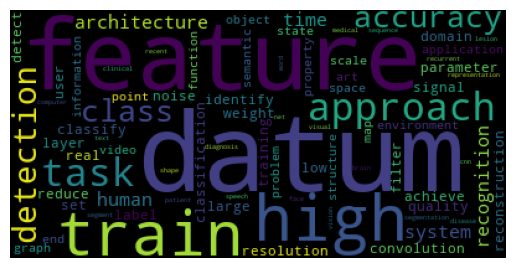

In [76]:
topic_words = get_topics_words(lda_model, num_topics) # Auslesen der Topicwörter 
plt.imshow(plot_wc(topic_words)) # Plotten der Wordcloud
plt.axis('off') # Ausblenden der Achsbeschriftung

Die Wordcloud stellt alle Wörter im Verhältnis zu ihrer Anzahl dar. Hierbei wird ersichtlich, dass die Wörter datum und feature am meisten vorkommen. Dies deutet darauf hin, dass oft über Merkmale gesprochen wird, was typisch für ein CNN ist. Das Wort datum lässt sich ohne weiteres schwieriger einordnen, da der Kontext fehlt. Wörter wie bpsw. train, accurary, detection und recognition sind weitere typische Begriffe im Kontext von CNNs. Anhand der Wordcloud lässt sich also eindeutig sagen, dass CNN als große Hauptkategorie angesehen werden kann. Somit ist dieses Ergebnis deckungsgleich mit dem urpsürnglichen Thema CNN, welches als Filterwort für den API-Abzug fungierte.<br>

Anhand der Topics, die sich größtenteils relativ sicher einordnen ließen, kann gesagt werden, dass das erarbeitete Modell zufriedenstellend arbeitet. Für die Verabeitung der Daten und dem Extrahieren der Topics werden ca. 5 bis 6 Minuten benötigt, wobei es akzeptable Ergebnisse liefert.

___
### 4.3.2 Topics über die einzelnen Jahre
Im nächsten Schritt soll geprüft werden, ob sich die Topics über die Jahre verändert haben. Hierfür wird für jedes Jahr ein Topicmodelling durchgeführt und eine Wordcloud erzeugt. Diese werden anschließend untersucht und bewertet.

In [77]:
# Erzeugen der benötigten Daten
df_yearly_papers = pd.DataFrame(df_data.drop_duplicates(["Title"]), copy=True)

Die Extremfilterwerte werden nachfolgend angepasst, da sich die Anzahl der Dokumente und damit auch der Wörter geändert hat. Zusätzlich wird die Anzahl der Topics verringert, zum einen weil die Datenmenge kleiner ist. Zum anderen aus Gründen der Übersichtlichkeit, da insgesamt 13 Jahre abgebildet werden.

In [78]:
num_topics = 5 # Legt die Anzahl der zu ermittelnden Topics fest

Um die Topics jeden Jahres zu ermitteln, wird mit einer For-Schleife gearbeitet. In dieser werden die Jahre iterativ ausgewertet und in ein Ergebnis Dataframe geschrieben. Während des Durchlaufs werden Informationen ausgegeben, die die wichtigstens Merkmale eines Jahres repräsentieren.

In [79]:
df_topics_per_year = pd.DataFrame() # Dataframe für Topics pro Jahr

topic_words_yearly = [] # leere Liste erzeugen

# vom ersten bis zum letzten Jahr durch iterieren
for year in range(df_yearly_papers["Published"].min().year, df_yearly_papers["Published"].max().year+1, 1):
    
    #Initialisieren eines temporären DF für die Topics im Jahr und filtern der Papers auf das entsprechende Jahr
    df_loop = pd.DataFrame(df_yearly_papers.drop(df_yearly_papers[df_yearly_papers["Published"].dt.year != year].index))
    
    # aktuelles Jahr ausgeben für die Übersicht
    print("\nTopics im Jahr %d" % year)
    print("Anzahl der Wörter: %d" % count_words(df_loop["Summary"]))
    print("Anzahl Dokumente: %d" % df_loop["Published"].shape[0])
    print("Durchschnittliche Wortanzahl pro Paper: %d" % (count_words(df_loop["Summary"])/df_loop["Published"].shape[0]))
    
    # Summary pro Paper übergeben
    df_loop_processed = pd.DataFrame(df_loop.drop_duplicates(["Title"]), copy=True).loc[:,("Summary")]
    
    # Daten tokenisieren und normalisieren
    df_loop_processed = data_normalization(df_loop_processed)
    
    # Create Dictionary
    vocabulary_loop = corpora.Dictionary(df_loop_processed) # Wörterbuch der enthaltenen Wörter mit zugehörigen Wort-IDs
    print("Anzahl der Wörter im Wörterbuch vor der Filterung: ", len(vocabulary_loop))

    # Filtern von Extremwerten
    vocabulary_loop.filter_extremes(no_below=2, # Mindestanzahl eines Worts, um erhalten zu bleiben
                                no_above=0.2) # Prozentsatz wie oft ein Wort im Wörterbuch maximal pro Dokument vorkommen darf
    print("Anzahl der Wörter im Wörterbuch nach der Filterung: ", len(vocabulary_loop))

    # Worthäufigkeit pro Dokument 
    corpus_loop = [vocabulary_loop.doc2bow(text) for text in df_loop_processed]
    
    # Modell trainieren
    try:
        lda_model_loop = gensim.models.LdaMulticore(corpus=corpus_loop, # Eingabe der Worthäufigkeitsvektoren
                                           id2word=vocabulary_loop, # Mapping von ID zum entsprechenden Wort
                                           num_topics=num_topics, # Anzahl der Topics
                                           random_state=815, # fester Wert für nachvollziehbarkeit
                                           chunksize=chunksize, # Übergabe der Chunksize
                                           passes=passes, # Übergabe der passes
                                           per_word_topics=True, 
                                           alpha=alpha, # Übergabe alpha-Wert
                                           eta=eta) # Übergabe beta-Wert
    # Bei zu geringer Anzahl der Wörter wird ValueErroe geschmissen
    except ValueError:
        print("Anzahl der Paper für das aktuelle Jahr zu gering!")
        print("Das Jahr %d wird übersprungen!" %year)      
        continue #in die nächste Iteration springen

    topic_words_loop = get_topics_words(lda_model_loop, num_topics) # Topicwörter auslesen
    topic_words_yearly.append(topic_words_loop) # Topicwörter an Liste anhängen   
    
    # Auslesen der Topics und diese in DF speichern
    df_topics_loop = pd.DataFrame([[word for rank, (word, prob) in enumerate(words)] 
             for topic_id, words in lda_model_loop.show_topics(formatted=False, num_words=10, num_topics=num_topics)], copy=True)
    df_topics_loop["year"] = year # entsprechndes Jahr eintragen
    df_topics_per_year = pd.concat([df_topics_per_year, df_topics_loop]) # Topics an Ergebnis-DF anhängen
    


Topics im Jahr 2011
Anzahl der Wörter: 99
Anzahl Dokumente: 1
Durchschnittliche Wortanzahl pro Paper: 99
Anzahl der Wörter im Wörterbuch vor der Filterung:  49
Anzahl der Wörter im Wörterbuch nach der Filterung:  0
Anzahl der Paper für das aktuelle Jahr zu gering!
Das Jahr 2011 wird übersprungen!

Topics im Jahr 2012
Anzahl der Wörter: 543
Anzahl Dokumente: 4
Durchschnittliche Wortanzahl pro Paper: 135
Anzahl der Wörter im Wörterbuch vor der Filterung:  220
Anzahl der Wörter im Wörterbuch nach der Filterung:  0
Anzahl der Paper für das aktuelle Jahr zu gering!
Das Jahr 2012 wird übersprungen!

Topics im Jahr 2013
Anzahl der Wörter: 3019
Anzahl Dokumente: 22
Durchschnittliche Wortanzahl pro Paper: 137
Anzahl der Wörter im Wörterbuch vor der Filterung:  653
Anzahl der Wörter im Wörterbuch nach der Filterung:  194

Topics im Jahr 2014
Anzahl der Wörter: 20349
Anzahl Dokumente: 128
Durchschnittliche Wortanzahl pro Paper: 158
Anzahl der Wörter im Wörterbuch vor der Filterung:  1980
Anzahl 

Anhand der Statusinformationen zeigt sich, dass für die Jahre 2011 und 2012 zu wenig Wörter nach der Extremwertfilterung übrig bleiben. Da in den Jahren lediglich eins bzw. vier Dokumente veröffentlich wurden, bringt ein Topicmodelling ohnehin keinen Mehrwert. Ab 2013 wurde für jedes Jahr ein Topicmodelling durchgeführt. Die Ergebnisse werden zur besseren Übersicht farblich nach den Jahren markiert. Topics für ungerade Jahre in grau und Topics für gerade Jahre in weiß.

In [100]:
# Anzeigen der Topics
df_topics_per_year.reset_index(drop=True).style.hide(axis="index").set_caption("Topics per Year")\
.apply(lambda x: ["background-color: #DCDCDC" if (x["year"]%2) == 1 else "" for i in x], axis=1)\
.apply(lambda x: ["background-color: white" if (x["year"]%2) == 0 else "" for i in x], axis=1) 

0,1,2,3,4,5,6,7,8,9,year
context,loss,end,region,patch,label,training,object,replace,function,2013
accuracy,domain,text,expert,hide,digit,human,sparse,implementation,unit,2013
object,single,instance,current,combine,extend,form,mean,level,novel,2013
unit,order,detection,combine,evaluate,recently,pooling,define,even,benchmark,2013
speech,phoneme,raw,improvement,compare,relative,vision,computer,character,processing,2013
part,pose,detector,pre,local,label,allow,fine,real,obtain,2014
human,code,patch,standard,cnn,low,vector,text,convolution,sample,2014
segmentation,class,category,system,go,exist,benchmark,depth,information,introduce,2014
pattern,descriptor,activation,scene,video,system,level,apply,cnn,include,2014
convolution,sentence,region,machine,language,translation,input,provide,generate,structure,2014


Nach der Ausgabe wird deutlich, dass ein manuelles Auswerten aller Topics jeden Jahres samt des Vergleiches nur schwer ohne sehr viel Aufwand durchführbar ist. Dies würde das Notebook massiv aufbhlähen, selbst bei nur 5 Topics pro Jahr. Um dies zu vermeiden, wird sich im nächsten Schritt auf die Wordclouds konzentriert, da diese einen großen Rahmen um das Jahr spannen und sich Änderungen wesentlich effektiver erkennen lassen.

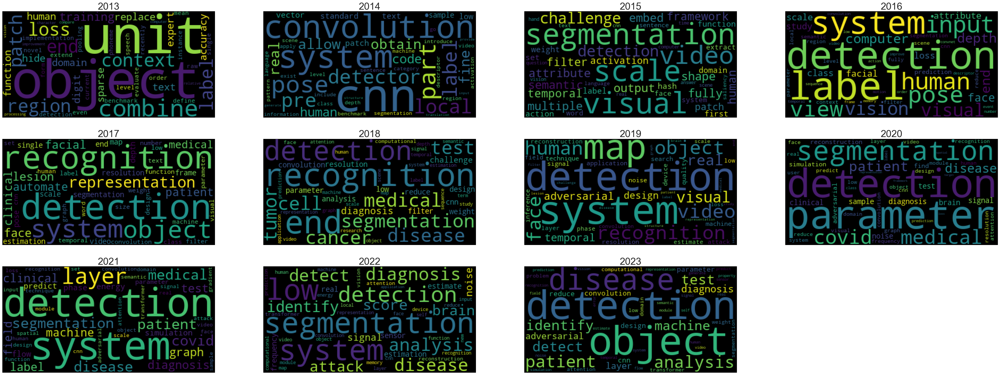

In [136]:
# PLotten der Wordclouds
plt.figure(figsize=(55,20))
for i in range(len(topic_words_yearly)):
    wordcloud = plot_wc(topic_words_yearly[i]) # Wordcloud erzeugen
    plt.subplot(3,4,i+1) # 3x4 Grid erzeugen und Achse zuweisen (Zeilen, Spalten, Nummer) 
    plt.title(2013+i,fontsize=30) # Jahr in den Titel schreiben
    plt.imshow(wordcloud) # Bild anzeigen
    plt.axis('off') # Ausblenden der Achsbeschriftung  

Anhand der Wordclouds fällt ein Vergleich wesentlich leichter und kann auch übersichtlicher dargestellt werden. Folglich wird wieder versucht anhand der Wörter und ihrer relativen Größe ein Haupttopic zu erkennen. <br>

<b>2013</b>: Object und unit wurden am meisten genannt, jedoch lässt sich hier kein explizites Thema eingrenzen. Die Wörter human und expert könnten einen Hinweis auf Expertensysteme oder Transfer Learning geben. <br>
<b>2014</b>: Die meisten Paper haben sich mit CNN-Systemen selbst beschäftigt, worauf cnn, convolution oder activation hinweisen. Wörter wie language, text und translation könnten auf NLP hinweisen.<br>
<b>2015</b>: In diesem Jahr scheinen sich viele Paper um visuelle Segmentation zu drehen, dabei taucht auch zum ersten Mal das Wort video auf. <br>
<b>2016</b>: Hauptsächlich drehten sich die Paper um Objekterkennung. Die Worte human und pose könnten darauf hindeuten, dass sich in diesem Jahr viele Paper mit der Action Recognition beschäftigt haben.  <br>
<b>2017</b>: In diesem Jahr ging es wieder hauptsächlich um Objekterkennung. Diese lässt in zwei Gebiete einteilen, zum einen die Gesichtserkennung, da facial und face deutlich erkennbar sind. Zum anderen tauchen medizinische Begriffe wie clinical, medical, patient und lesion auf, was auf medizinische Anwendungen deutet. <br>
<b>2018</b>: Hier geht es ebenfalls um die Objekterkennung bzw. -detektion im medizinischen Bereich. Wörter wie cancer, tumor, disease, cell, diagnosis und medical dominieren signifikant die Wordcloud.<br>
<b>2019</b>: Es scheinen sich wieder mehr Paper mit der Erkennung von Menschen und Gesichtern beschäftigt zu haben. Zusätzlich könnten sich die Wörter real und video auf eine Echtzeitanalyse von Videos beziehen.<br>
<b>2020</b>: Hierin lässt sich klar das erste Coronajahr erkennen. Medizinische Begriffe dominieren wieder klar, wobei sogar das Wort covid relativ stark vertreten ist. Dies deutet darauf hin, dass die Corona-Pandemie im Fokus der Arbeiten lag z.B. durch Mustererkennung in der Verbreitung des Virus oder der Übertragungswege.<br>
<b>2021</b>: In diesem Jahr fokussiert sich nach wie vor der Großteil auf auf medizinische Anwendungen, wobei das Wort covid leicht an Wert verloren hat.<br>
<b>2022</b>: Nach wie vor scheinen auch in diesem Jahr medizinische Begriffe zu dominieren. Die Worte brain und memory könnten ein Hinweis darauf sein, dass in diesem Jahr long-covid Symptome im Mittelpunkt der Forschung standen. <br>
<b>2023</b>: Auch 2023 scheinen der Großteil der Paper auf medizinische Anwendungen bzw. Zwecke fokussiert zu sein, da diese weiterhin die Wordcloud einnehmen.<br>

Bis 2017 scheint sich der Großteil der Paper hauptsächlich um klassische Objekterkennung und -segmentierung sowie Klassifizierung zu drehen. Im selben Jahr tauchen erste medizinische Begriffe auf, welche aber noch nicht dominierend sind. 2018 konzentrierten sich die Mehrheit der Paper auf medizinische Anwendungen. Im Jahr 2019 tauchen keine medizinischen Begriffe mehr auf, dafür liegt der Fokus in diesem Jahr wieder mehr auf Menschen und Gesichter sowie vermutlich die Echtzeitanalyse von Videos. Ab dem Jahr 2020 dominieren wieder klar medizinische Begriffe, was mit der Corona-Pandemie begründet ist. Diese taucht selbst(covid) 2020 und 2021 unter den meistgenannten Wörtern auf. In den Jahren 2022 und 2023 wird diese nicht mehr explizit mit aufgeführt, vermutlich hängen die weiterhin medizinischen Themen mit der Pandemie kausal zusammen. <br>

Abschließend lässt sich ein eindeutiger Trend über die Jahre erkennen, es gab also thematische Änderungen in den Forschungsarbeiten. Von 2013 bis 2017 waren die Topics noch relativ ausgewogen und divers. Ab 2018, mit Ausnahme von 2019, gab es eine Art Überrepräsentation von Anwendungen aus dem medizinischen Bereich, der bis heute anhält. Objektdetection bzw. -segmentation bilden jedoch seit 2015 das große Hauptthema, was sich mit anderen Topics fachlich zusammenfügt. Das Topic 8-Medizinische Anwendung aus dem [Kapitel 4.3.1](#4.3.1) ist das mit Abstand höchstgewichtigste Topic der Paper, was diese Analyse über die Jahre gezeigt hat.